<a href="https://colab.research.google.com/github/bonvech/MSU-AI/blob/main/Copy_of_L13_Generative_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 <font size="6">Генеративные модели</font>

# Общий взгляд на генеративные алгоритмы

## Задача генерации

Ранее мы в основном работали с **размеченными** данными. Мы научили нейронные сети решать задачи классификации, регрессии, сегментации и т. д. На входе модели у нас были исходные данные, по которым мы учились предсказывать целевые значения (метки классов, действительные числа, маски сегментации и т. д.):

$$\large \text{Входные данные} \xrightarrow[\text{}]{\text{Модель}} \text{Целевые значения}$$

Математически это можно записать так:

$$\large X \xrightarrow[\text{}]{f_{θ}(x)} Y ,$$
где $X$ — множество входных данных, $Y$ — множество целевых значений, $f_{θ}(x)$ — модель с настраиваемыми параметрами $θ$.

По сути наша модель — это сложная функция, которая ставит в соответствие каждому объекту $x$ из множества входных данных $X$ целевое значение $y$ из множества выходных данных $Y$:
$$\large y = f_{θ}(x)$$


С задачей генерации дела обстоят сложнее, ведь в задаче генерации мы хотим научить модель генерировать объекты, которых не было в исходной выборке.

**Постановка задачи генерации**

**Дано**: данные, часто неразмеченные.

**Результат генерации**: новые данные, которые будут удовлетворять следующим условиям:
* Новые данные **похожи** на исходные.
* Новые данные **не повторяют** исходные.

**Вход модели**: ❓

**Дополнительно:**
* Важен **элемент случайности**: результат генерации не повторяется при разных запусках.

Итого не очень понятно, **что должно подаваться на вход модели** и как обеспечить элемент случайности. В большинстве моделей генерации в качестве входных данных для модели используют **гауссовский или равномерный шум.**

$$\large \text{Шум} \xrightarrow[\text{}]{\text{Модель генерации}} \text{Сгенерированный объект}$$

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/generator_model_pipeline.png" width="500"></center>

Математически это можно записать так:

$$\large Z \xrightarrow[\text{}]{g_{θ}(z)} X, $$
где $Z$ — хорошо изученное множество (например, нормальное гауссово распределение), из которого мы умеем семплировать объекты, $X$ — множество всех возможных объектов с неизвестным распределением или известным распределением, из которого мы не умеем семплировать.

По сути модель генерации — это сложная функция, которая ставит в соответствие выборке из известного распределения $z$ объект из целевого распределения $x$:
$$\large x = g_{θ}(z)$$


<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/generative_models.png" width="700"></center>

## Простейший пример: генерация объектов из нормального распределения

Чтобы обеспечить воспроизводимость примеров, зафиксируем начальные значения генераторов случайных чисел:

In [ ]:
import torch
import random
import numpy as np


def set_random_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


set_random_seed(42)

Предположим, у нас под рукой есть генератор случайных чисел, который позволяет нам легко получить случайные числа в диапазоне $[0,1]$:

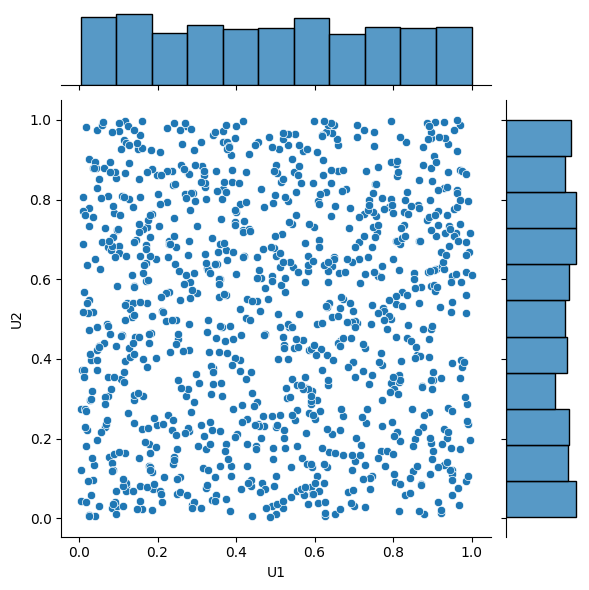

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

u1 = np.random.uniform(size=1000)
u2 = np.random.uniform(size=1000)

data = pd.DataFrame.from_dict(dict(zip(["U1", "U2"], [u1, u2])))

sns.jointplot(data=data, x="U1", y="U2")
plt.show()

Пусть $U_i$ — точка, которую даёт нам генератор равномерно распределенных случайных чисел. Если мы возьмём пару таких точек $U_1$, $U_2$ и произведём с ними так называемое [преобразование Бокса-Мюллера 📚[wiki]](https://en.wikipedia.org/wiki/Box%E2%80%93Muller_transform), то получим пару новых точек $X$ и $Y$ на вещественной прямой:

$$
\begin{array}{l}
X=\sqrt{-2 \log U_{1}} \cos \left(2 \pi U_{2}\right) \\
Y=\sqrt{-2 \log U_{1}} \sin \left(2 \pi U_{2}\right)
\end{array}
$$

Повторив такую процедуру для большого числа точек $U_i$, можно заметить, что распределение для объектов $X$ и $Y$ становится похожим на стандартное нормальное:

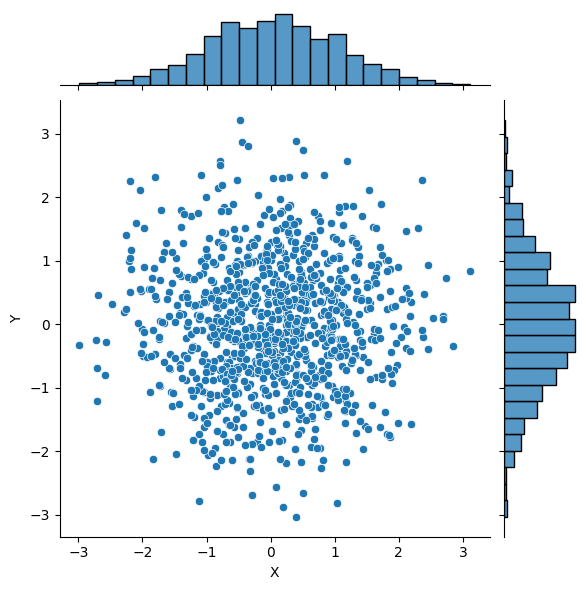

In [ ]:
r = np.sqrt(-2 * np.log(u1))
theta = 2 * np.pi * u2

x = r * np.cos(theta)
y = r * np.sin(theta)

data["X"] = x
data["Y"] = y

sns.jointplot(data=data, x="X", y="Y")
plt.show()

На самом деле мы можем в точности доказать, что преобразование Бокса-Мюллера преобразовало исходное равномерное распределение в стандартное нормальное.
[Доказательство 📚[book]](https://mathworld.wolfram.com/Box-MullerTransformation.html).

Можно раскрасить точки выборки и посмотреть, как именно они преобразуются:

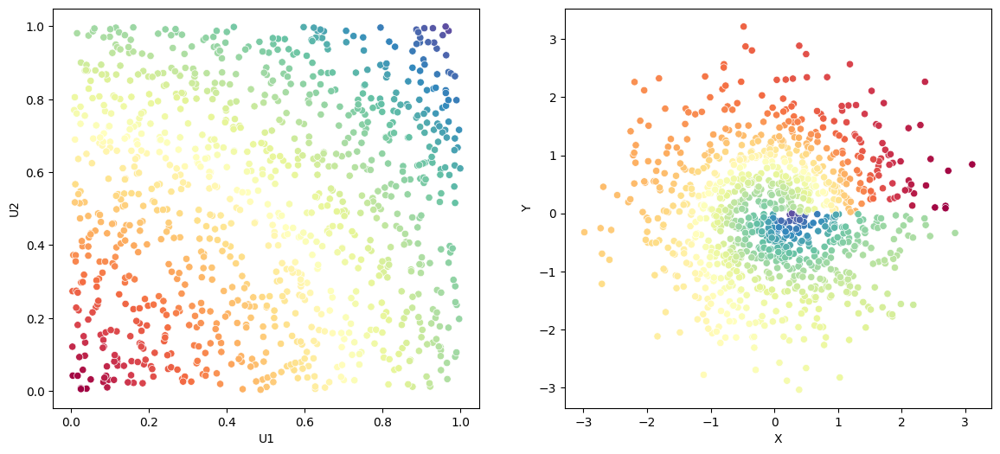

In [ ]:
color = np.sqrt(u1 * u1 + u2 * u2)  # for visualization
color = color / color.max()
data["color"] = color

f, ax = plt.subplots(1, 2, figsize=(14, 6))

cmap = sns.color_palette("Spectral", as_cmap=True)
sns.scatterplot(
    data=data,
    x="U1",
    y="U2",
    hue="color",
    palette=cmap,
    ax=ax[0],
    legend=False,
)
sns.scatterplot(
    data=data, x="X", y="Y", hue="color", palette=cmap, ax=ax[1], legend=False
)
plt.show()

Что делать, если нам хочется сгенерировать объекты не в стандартном нормальном распределении, а в каком-то более сложном? В общем случае нам необходимо подобрать некоторую функцию, которая будет отображать объекты из известного "простого" распределения в "целевое". Осуществляющие такое преобразование функции будем называть **генеративными моделями**.

Если целевое распределение $\mathcal{F}[\vec {x}]$ известно аналитически, то для подбора такой функции можно воспользоваться различными модификациями алгоритма [Markov Chain Monte Carlo 📚[wiki]](https://en.wikipedia.org/wiki/Markov_chain_Monte_Carlo).

# Генеративные алгоритмы, основанные на глубоком обучении

[[video] 📺 Behind the Scenes of GANs, VAEs and Flow-based Generative Models](https://youtu.be/szQHWHNVv18?si=tNUAFkFp9TdyUZdx)

Существует четыре основных типа алгоритмов генерации, основанных на глубоком обучении:
* **VAE** — был подробно рассмотрен на предыдущей лекции,
* **GAN** и **диффузионные модели** — мы рассмотрим сегодня,
* **flow-based** модели — с ними можно ознакомиться [самостоятельно ✏️[blog]](https://lilianweng.github.io/posts/2018-10-13-flow-models/).

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/deep_generative_models.png" width="700"></center>

# Введение  в генеративно-состязательные нейронные сети GAN

[[demo] 🎮 Множество примеров различных генераторов GAN](https://thisxdoesnotexist.com)


## Вход модели (latent space)

В качестве входа модели используют **вектор независимых случайных величин**.

Входной вектор можно рассматривать как **признаки генерируемых объектов**. Если мы будем передавать только одно случайное число, то генерация будет однообразной. Чем больше признаков (степеней свободы) у входного вектора, тем потенциально разнообразнее может быть результат генерации.

Пространство, из которого семплируются входные векторы, называется **latent space** — так же, как и скрытое пространство в автоэнкодерах.

Нужно понимать различие: в автоэнкодерах распределение векторов в скрытом пространстве формируется энкодером (хотя мы можем управлять им с помощью регуляризации), а в GAN и диффузионных моделях — задается фиксированным. Поэтому в литературе также встречается вариант "predefined latent space".

### Распределение векторов в латентном пространстве

Как мы уже знаем, инициализация весов и нормализация входных данных улучшают сходимость обучения. Поэтому для латентного пространства обычно используют **многомерное стандартное нормальное распределение**:

$$Z \sim \mathcal{N}(\mathbf{0}, \mathbf{I})$$

Можно рассчитывать, что после обучения при перемещении по латентному пространству свойства генерируемых объектов будут плавно меняться.

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L13/input_latent_space_lin_interpol.png" width="400"></center>

<center><em>Линейные интерполяции между четырьмя изображениями в латентном пространстве</em></center>

<center><em>Source: <a href="https://arxiv.org/abs/1803.09093">Comparing Generative Adversarial Network Techniques for Image Creation and Modification (M. Pieters, M. Wiering, 2018)</a></em></center>

## Наивный подход в решении задачи генерации

В этой лекции мы будем использовать `lightning` для обучения и `tbparse` для визуализации логов.

In [ ]:
from IPython.display import clear_output

!pip install -q --upgrade diffusers transformers accelerate
!pip install -q torchmetrics[image]
!pip install -q lightning tbparse

clear_output()

Чтобы обеспечить воспроизводимость примеров, зафиксируем начальные значения генераторов случайных чисел:

In [ ]:
import torch
import random
import numpy as np


def set_random_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


set_random_seed(42)

Попробуем собрать **генератор точек неизвестной функции**. В качестве функции будем использовать **параболу**. Для начала напишем код, который будет создавать **истинные точки**:

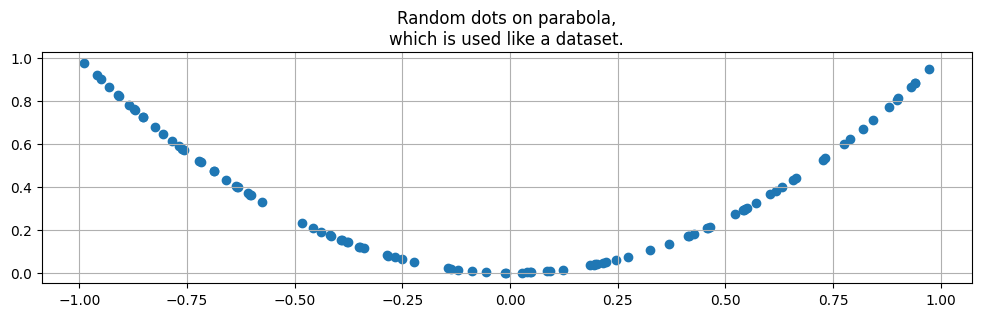

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


def create_pair(num=100):
    x = np.random.uniform(low=-1, high=1, size=(num,))
    y = x * x
    return np.hstack(
        (x.reshape(-1, 1), y.reshape(-1, 1))
    )  # Create num of correct dots(x,y) on parabola


pairs = create_pair(100)
plt.figure(figsize=(12, 3))
plt.scatter(pairs[:, 0], pairs[:, 1])
plt.grid()
plt.title("Random dots on parabola,\nwhich is used like a dataset.")
plt.show()

Напишем датасет, который будет выдавать случайный шумовой вектор входного латентного пространства размерностью `ls = 1` и истинные объекты.
Мы заранее создаем в функции  `__init__` точки, которые будем считать истинными.

In [ ]:
import torch
from torch.utils.data import DataLoader, Dataset


# Define input parameters
n_batches = 30
batch_size = 128
ls = 1  # latent space


class ParabolaDS(Dataset):
    def __init__(self, n_batches, batch_size, ls):
        # create ground true item
        self.xy_pair = torch.tensor(
            create_pair(num=(n_batches * batch_size)), dtype=torch.float
        )
        self.ls = ls

    def __len__(self):
        return self.xy_pair.shape[0]

    def __getitem__(self, idx):
        # get ground true item
        item = self.xy_pair[idx]
        # generate random noise
        noise = torch.randn(self.ls, dtype=torch.float)
        return item, noise


trainset = ParabolaDS(n_batches, batch_size, ls)
train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)

Определим простую модель, которая будет ожидать шум на входе и генерировать точки на выходе. Обратите внимание, что функция активации на последнем слое отсутствует, поскольку мы не ограничиваем наш генератор каким-то диапазоном.

In [ ]:
import torch.nn as nn


class Generator(nn.Module):
    def __init__(self, latent_space, hidden_dim=50):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_space, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 2),
        )  # x,y

    def forward(self, x):
        return self.model(x)

Напишем функцию для оценки качества работы модели.

Так как мы не знаем, в каком месте параболы генератор создаст новую точку, то непонятно, с каким элементом из датасета ее сравнивать.

**Вариант №1 (задача уже решена)**

Для сгенерированного $x$ аналитически вычислять $y_{\text{target}}=x*x$ и считать разницу между $y$, сгенерированным моделью, и $y_{\text{target}}$, вычисленным аналитически:

In [ ]:
def custom_loss(pair, label):
    # All inputs are batches
    x_fake = pair[:, 0]
    y_fake = pair[:, 1]
    return torch.abs(x_fake * x_fake - y_fake).mean()  # average by batch

Это будет работать.

Однако если мы **знаем способ точно предсказать выход по входу**, то **задача уже решена** и нейронная сеть не нужна.

**Вариант №2 (как не надо делать)**

Найти в датасете точку  $ \text{target} = (x_{\text{target}},y_{\text{target}})$, наиболее близкую к созданной генератором $ \text{generated} = (x,y)$, и использовать расстояние между этими точками в качестве функции потерь.

$$\large \text{Loss} = \min(\text{dist}(\text{target}_{i},\text{generated}))$$


**В пространстве высокой размерности** такой поиск будет весьма **ресурсозатратным**, но в нашем учебном примере работать будет.


In [ ]:
class Loss(nn.Module):
    def __init__(self, targets):
        super().__init__()
        self.targets = targets  # Remember all real samples, impossible in real world

    def forward(self, input, dummy_target=None):
        dist = torch.cdist(input, self.targets)  # claculate pairwise distances (euc.)
        min_dist, index = torch.min(dist, dim=1)  # take the best
        return min_dist.mean()

Основной код обучения:

In [ ]:
import lightning as L

# DON'T USE IT! IT'S NAIVE DECISION!


class NaiveGeneration(L.LightningModule):
    def __init__(self, model, criterion):
        super().__init__()
        self.model = model
        self.criterion = criterion

    def configure_optimizers(self):
        self.criterion.targets = self.criterion.targets.to(
            self.device
        )  # for fix device diff
        optimizer = torch.optim.Adam(self.model.parameters(), lr=1e-3)
        return optimizer

    def training_step(self, batch, batch_idx):
        real_items, noises = batch
        gen_items = self.model(noises)
        loss = self.criterion(gen_items, real_items)
        self.log("loss/train", loss, on_epoch=True, on_step=False)
        return loss

Целевые точки из датасета запоминаются в `loss`, затем идет обычный цикл обучения:

In [ ]:
!mkdir log_naive/
!mkdir log_naive/lightning_logs

In [ ]:
from warnings import simplefilter

simplefilter("ignore", category=RuntimeWarning)

num_epochs = 10

criterion = Loss(trainset.xy_pair)  # save target
model = Generator(latent_space=ls)

pl_model = NaiveGeneration(model, criterion)
trainer = L.Trainer(
    max_epochs=num_epochs,
    logger=L.pytorch.loggers.TensorBoardLogger(save_dir="./log_naive/"),
    log_every_n_steps=10,
)

trainer.fit(
    model=pl_model,
    train_dataloaders=train_loader,
)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name      | Type      | Params
----------------------------------------
0 | model     | Generator | 2.8 K 
1 | criterion | Loss      | 0     
----------------------------------------
2.8 K     Trainable params
0         Non-trainable params
2.8 K     Total params
0.011     Total estimated model params size (MB)
INFO:lightning.pytorch.callbacks.model_summar

Training: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=10` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


Посмотрим, куда были сохранены логи:

In [ ]:
log_dir = pl_model.logger.log_dir
log_dir

'./log_naive/lightning_logs/version_0'

Визуализируем кривую обучения, чтобы удостовериться, что модель учится:

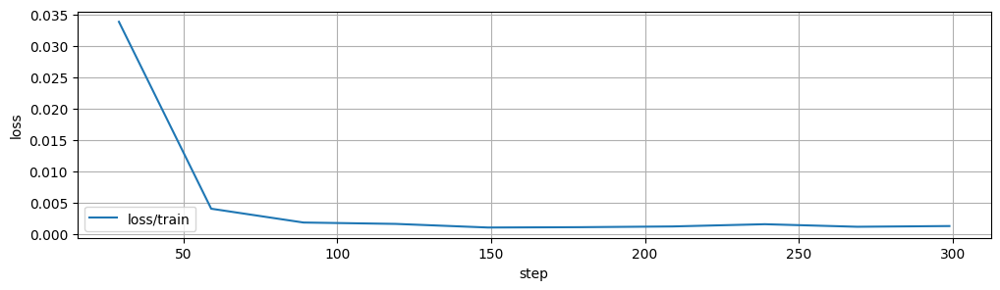

In [ ]:
from tbparse import SummaryReader


def tbparse_visual(log_dir, figsize=(12, 3)):
    # visualization without TensorBoard for TensorBoard logs
    clear_output()
    reader = SummaryReader(log_dir)
    df = reader.scalars

    plt.figure(figsize=figsize)
    for tag in df.tag.unique():
        if "loss" in tag:
            tag_data = df.query("`tag` == @tag").sort_values(by="step")
            plt.plot(tag_data.step, tag_data.value, label=tag)
    plt.xlabel("step")
    plt.ylabel("loss")
    plt.legend(loc="lower left")
    plt.grid()
    plt.show()


tbparse_visual(log_dir)

Посмотрим результаты генерации на шуме:

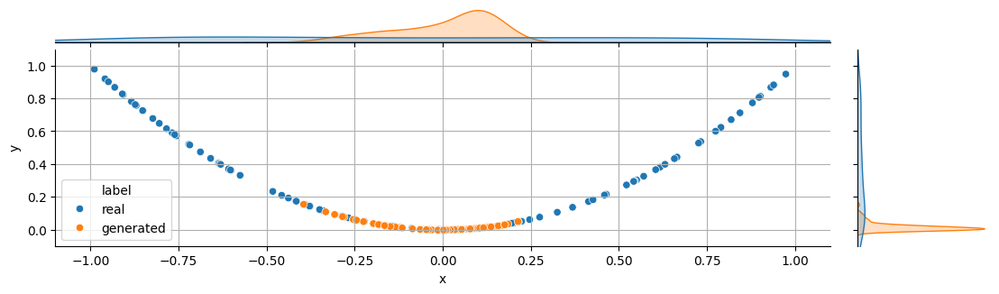

In [ ]:
def test_image(pair_gen, pairs, figsize=(12, 3)):
    # equalizing lengths for better visualization
    if len(pair_gen) > len(pairs):
        pair_gen = pair_gen[: len(pairs)]
    else:
        pairs = pairs[: len(pair_gen)]

    df = pd.DataFrame(data=np.concatenate([pairs, pair_gen]), columns=["x", "y"])
    df["label"] = ["real"] * len(pairs) + ["generated"] * len(pair_gen)

    plot = sns.jointplot(data=df, x="x", y="y", hue="label")
    sns.move_legend(plot.ax_joint, "lower left")
    if figsize:
        plot.fig.set_size_inches(figsize)
    plt.axis([-1.1, 1.1, -0.1, 1.1])
    plt.grid()
    plt.show()


model.eval().to("cpu")
noise = torch.tensor(np.random.normal(size=(1000, ls)), dtype=torch.float)
with torch.no_grad():
    pair_gen = model(noise).detach().numpy()

test_image(pair_gen, pairs, figsize=(12, 3))

Видно, что модель генерирует точки, лежащие на параболе, но при этом видно, что **распределение сгенерированных точек существенно отличается от распределения реальных точек**. Сгенерированные точки лежат в небольшом интервале около $0$. Это можно объяснить тем, что значения ошибок около нуля в среднем меньше, ведь $y$ около $0$ принимает небольшой диапазон значений.

В функции потерь мы прописали, что сгенерированная точка должна лежать на параболе, и модель обучилась. Но информацию о том, что **генератор должен повторять распределение реальных данных**, мы в функции потерь никак не кодировали. Более того, модель может научиться хорошо генерировать одну единственную точку, и при этом функция потерь может стать нулевой.

Кроме того, для расчета функции потерь сейчас необходимо **хранить все известные точки**. Если бы мы генерировали не точки, а изображения или спектры, мы бы получили **переполнение оперативной памяти**.

Итак, надо решить **две проблемы**:
1.   Закодировать в функции потерь условие о том, что **точки должны быть различными**.
2.   Придумать способ проверки, **не требующий хранения и перебора всего датасета**.

## Дискриминатор

Будем наказывать нейронную сеть не с помощью функционала ошибок , а второй
**сетью**, которая будет определять, лежит ли сгенерированная точка на параболе.

Создадим сеть-классификатор точек, которую назовём **дискриминатор**.

В общем случае задача дискриминатора — определять, **принадлежит ли объект к распределению обучающей выборки**. Если предсказания генератора выродятся в одно значение, дискриминатор легко запомнит, что эти точки — сгенерированные.


**Итого** мы имеем:
- **генератор**, выдающий точки, которые могут принадлежать параболе, а могут не принадлежать ей;
- **дискриминатор**, который будет их различать.

Мы будем подавать в **дискриминатор** **реальные точки**, помечая их реальными,  и **точки, которые выдаёт генератор**, считая их подделкой. **Генератор** будет учиться **подражать** реальным данным, а дискриминатор будет учиться **отличать** реальные точки, от подделок.

Мы пришли к идее **генеративно-состязательных** нейронных сетей (Generative Adversarial Network).

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/generative_adversarial_network_scheme.png" width="800"></center>
<center><em>Схематичное представление архитектуры GAN </em></center>

В нашем примере с генерацией точек на плоскости в качестве дискриминатора может быть использована полносвязная нейронная сеть с парой скрытых слоев, которая принимает на вход $2$ числа — координаты точки, и выдает одно число — оценку вероятности, что поданная на вход точка принадлежит распределению реальных данных.

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, hidden_dim):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(2, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 1),  # real/fake
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.model(x)

##  Generative adversarial network (GAN)

**Генеративно-состязательные** сети были предложены Ианом Гудфеллоу в работе [Generative Adversarial Networks (Goodfellow et al., 2014) 🎓[arxiv]](https://arxiv.org/abs/1406.2661) (**Cited by 62647 (декабрь 2023)**). Принцип состязательности в сети GAN часто объясняют на примере из теории игр.

Полезное:
* [[video] 📺 Разбор оригинальной статьи GAN](https://www.youtube.com/watch?v=eyxmSmjmNS0)
* [[video] 📺 Лекция Иана Гудфеллоу](https://www.youtube.com/watch?v=HGYYEUSm-0Q)

### GAN в теории игр

Математически можно описать идею GAN как [**игру** 📚[wiki]](https://ru.wikipedia.org/wiki/%D0%A2%D0%B5%D0%BE%D1%80%D0%B8%D1%8F_%D0%B8%D0%B3%D1%80) **двух игроков**:

- Первый игрок — это **фальшивомонетчик** или генератор (generator).
- Второй — это **банкир** с машинкой для проверки денег или дискриминатор (discriminator).

Задача фальшивомонетчика — обмануть банкира. Задача банкира — отличить реальные деньги от фальшивых.

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/gan_idea.png" width="600"></center>





Фальшивомонетчику необходим элемент случайности $z$.

Можно привести аналогию: если все фальшивые купюры будут иметь одинаковый номер, банкиру будет очень просто определить подделку.

Фальшивомонетчик берет на вход шум $z$ и генерирует фальшивую пачку денег $G(z)$.



Банкир получает на вход пачку купюр $x$, проверяет их подлинность и сообщает вектор $D(x)$, состоящий из чисел от нуля до единицы — свою уверенность (вероятность) по каждой купюре в том, что она настоящая.

**Цель банкира (дискриминатора):** отличить реальные деньги от фальшивых

$$D(x) = 1,  \text{ для }  x - \text{real},$$

$$D(G(z)) = 0, \text{ для } G(z) - \text{ fake},$$

то есть максимизировать $\log(D(x))+\log(1-D(G(z)))$.

**Цель фальшивомонетчика (генератора):** убедить банкира в том, что подделки настоящие

$$D(G(z)) = 1, \text{ для } G(z) - \text{ fake},$$

то есть минимизировать $\log(1-D(G(z)))$.



Математически это можно записать так:

$$\large \min\limits_{\theta_g}  \max\limits_{\theta_d} \left(\mathbb{E}_{x \sim p(x)} \left[\log\left(D_{\theta_d}(x)\right)\right]+\mathbb{E}_{z \sim p(z)}
\left[\log\left(1-D_{\theta_d}\left(G_{\theta_g}(z)\right)\right)\right]\right),$$

где $\theta_g$ — параметры генератора, $\theta_d$ — параметры дискриминатора, $p(x)$ — распределение вероятностей целевых объектов, $p(z)$ — распределение вероятностей входного шума.


<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/gan_probability_learning_process.png" width="1000"></center>

<center><em>Процесс обучения GAN. (a) — начало обучения, распределение сгенерированных объектов не совпадает с распределением реальных объектов, (b)&nbsp;—&nbsp;результат шага обучения, распределение сгенерированных объектов приближается к распределению реальных объектов, (c) — идеальный результат в конце обучения: полное совпадение распределений (на практике почти недостижим). </em></center>
<center><em>
Замечание: в данном случае для простоты восприятия и визуализации входной шум имеет равномерное распределение (на практике чаще используется нормальное), а распределение реальных объектов имеет нормальное распределение (на практике — сложное неизвестное распределение).</em></center>

<center><em>Source: <a href="https://arxiv.org/pdf/1406.2661.pdf">Generative Adversarial Nets (Ian J. Goodfellow and all, 2014)</a></em></center>

**Дискриминатор (банкир):**
- обучается при **фиксированном генераторе** ${G}_{\theta_{g}}$,
- **максимизирует** функцию выше относительно $\theta_d$ (**градиентный подъем**),
- решает задачу **бинарной классификации**: старается присвоить $1$ точкам данных из обучающего набора $x\sim p(x)$ и $0$ сгенерированным точкам $G(z), z\sim p(z)$.

**Генератор (фальшивомонетчик):**
- обучается при **фиксированном дискриминаторе** $D_{θ_d}$,
- получает градиенты весов за счет **обратного распространения ошибки** через дискриминатор,
- **минимизирует** функцию выше относительно $\theta_g$ (**градиентный спуск**).

В процессе совместного конкурентного обучения, если система достаточно сбалансирована, достигается **минимаксное состояние равновесия**, в котором обе сети эффективно учатся.


### GAN Практический пример

Определим наши **генератор** и **дискриминатор**:

In [ ]:
class Generator(nn.Module):
    def __init__(self, latent_space, hidden_dim):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_space, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 2),
        )  # x,y

    def forward(self, x):
        return self.model(x)


class Discriminator(nn.Module):
    def __init__(self, hidden_dim):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(2, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 1),  # real/fake
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.model(x)

Обратите внимание, что у нас так же, как и в первом примере, есть переменная **latent space**. Это тот шум, из которого мы будем генерировать наши точки.

**Дискриминатор** решает задачу **бинарной классификации**. Для этой задачи хорошо подходит `BCELoss` [🛠️[doc]](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html) (**Binary Cross-Entropy**).

<font size="4">**Процесс обучения GAN**</font>

<font size="4">**Фаза 1. Обучение дискриминатора**</font>

1. Расчет градиентов дискриминатора (реальные точки):
    * обнулим градиенты **дискриминатора**,
    * возьмем набор **реальных точек**, которые лежат на параболе,
    * применим к ним **дискриминатор**,
    * посчитаем значение функции потерь дискриминатора на **реальных точках** при **метках реальных данных** `loss_disc_real`,
    * посчитаем градиенты для **дискриминатора**.



<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/gan_training_algorithm_1.png" width="1000"></center>

По аналогии с игрой: в этот момент банкир изучает **реальные купюры**, чтобы усовершенствовать машинку для проверки денег.

2. Расчет градиентов дискриминатора (сгенерированные точки):
    * возьмем случайный шум
$z$,
    * возьмем наш **генератор** (его пока не обучаем) и создадим с его помощью **сгенерированные точки** $x=G(z)$,
    * применим к ним **дискриминатор**,
    * посчитаем значение функции потерь дискриминатора на **сгенерированных точках** при **метках сгенерированных данных** `loss_disc_fake`,
    * посчитаем градиенты для **дискриминатора** (они сложатся с уже посчитанными ранее).

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/gan_training_algorithm_2.png" width="1000"></center>

По аналогии с игрой: в этот момент банкир изучает **фальшивые купюры**, чтобы усовершенствовать машинку для проверки денег.

3. Обновление весов дискриминатора
   * сделаем шаг обучения **дискриминатора** (обновим его веса),
   * **генератор** не обучается.

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/gan_training_algorithm_3.png" width="1000"></center>

По аналогии с игрой: в этот момент банкир **модифицирует машинку**.

<font size="4">**Фаза 2. Обучение генератора**</font>

   * обнулим градиенты **генератора**,
   * сгенерируем случайный шум $z$,
   * создадим с помощью **генератора** набор **сгенерированных точек** $x=G(z)$,
   * посчитаем значение функции потерь дискриминатора на **сгенерированных точках** при **метках реальных данных** `loss_gen` (подмена меток),
   * посчитаем градиенты для **генератора**,
   * сделаем шаг обучения **генератора** (обновим его веса),
   * **дискриминатор** не обучается.

Обратите внимание, что вместо решения minmax задачи мы **подменяем метки**: дискриминатор получает сгенерированные объекты, но в функцию потерь передается метка реальных объектов. Это [часто применяемый трюк 🐾[git]](https://github.com/soumith/ganhacks/#2-a-modified-loss-function) при обучении GAN.

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/gan_training_algorithm_4.png" width="1000"></center>

По аналогии с игрой: в руки фальшивомонетчика попадается прибор для распознавания подделок, он изучает его и учится создавать подделки, которые смогут обмануть этот прибор.

Посмотрим, как это реализуется в коде обучения:

In [ ]:
class GAN(L.LightningModule):
    def __init__(
        self,
        generator,
        discriminator,
        lr=3e-4,
        betas=(0.9, 0.999),
        noise_in_place=False,
        latent_dim=10,
    ):
        super().__init__()
        self.automatic_optimization = False  # for hand made settings

        self.generator = generator
        self.discriminator = discriminator
        self.criterion = nn.BCELoss()
        self.real_label = 1.0
        self.fake_label = 0.0
        self.lr = lr
        self.betas = betas
        self.noise_in_place = noise_in_place
        self.latent_dim = latent_dim

    def configure_optimizers(self):
        opt_gen = torch.optim.Adam(
            self.generator.parameters(),
            lr=self.lr,
            betas=self.betas,
        )
        opt_disc = torch.optim.Adam(
            self.discriminator.parameters(),
            lr=self.lr,
            betas=self.betas,
        )
        return opt_gen, opt_disc

    def training_step(self, batch, batch_idx):
        if self.noise_in_place:  # for standart dataset
            self.real_items, _ = batch
            noises = torch.randn(
                (self.real_items.shape[0], self.latent_dim),
                dtype=torch.float32,
            ).to(self.device)
        else:
            self.real_items, noises = batch  # for handmade dataset
        opt_gen, opt_disc = self.optimizers()

        # ---------------------
        # Train discriminator
        # ---------------------
        self.discriminator.zero_grad()
        # 1. discriminator on real items
        real_label = torch.full(
            size=(self.real_items.shape[0], 1),
            fill_value=self.real_label,
            dtype=torch.float,
        ).to(self.device)
        disc_label = self.discriminator(self.real_items)
        loss_disc_real = self.criterion(disc_label, real_label)
        loss_disc_real.backward()

        # 2. discriminator on fake items
        fake_label = torch.full(
            size=(self.real_items.shape[0], 1),
            fill_value=self.fake_label,
            dtype=torch.float,
        ).to(self.device)
        self.fake_items = self.generator(noises)
        disc_label = self.discriminator(self.fake_items)
        loss_disc_fake = self.criterion(disc_label, fake_label)
        loss_disc_fake.backward()

        # 3. discriminator optimizer step (on real and fake items)
        opt_disc.step()
        loss_disc = 0.5 * loss_disc_real + 0.5 * loss_disc_fake
        self.log("loss/disc", loss_disc, on_epoch=False, on_step=True)

        # ---------------------
        # Train generator
        # ---------------------
        self.generator.zero_grad()
        self.fake_items = self.generator(noises)
        disc_label = self.discriminator(self.fake_items)
        loss_gen = self.criterion(disc_label, real_label)  # flip label
        loss_gen.backward()

        opt_gen.step()
        self.log("loss/gen", loss_gen, on_epoch=False, on_step=True)

        if (batch_idx + 1) % 1000 == 0:
            tbparse_visual(self.logger.log_dir)
            test_image(
                self.fake_items.detach().cpu().numpy(),
                self.real_items.detach().cpu().numpy(),
            )

    def on_train_epoch_end(self):
        tbparse_visual(self.logger.log_dir)
        test_image(
            self.fake_items.detach().cpu().numpy(),
            self.real_items.detach().cpu().numpy(),
        )

Определим **входные параметры**. Для обучения GAN нужно много реальных объетов.

In [ ]:
latent_dim = 10  # latent space
num_epochs = 1
n_batches = 10000
batch_size = 512

Создадим модели:

In [ ]:
set_random_seed(42)
trainset = ParabolaDS(n_batches, batch_size, latent_dim)

train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)

generator = Generator(latent_space=latent_dim, hidden_dim=50)
discriminator = Discriminator(hidden_dim=50)

pl_model = GAN(generator, discriminator)

Обучим наш GAN:

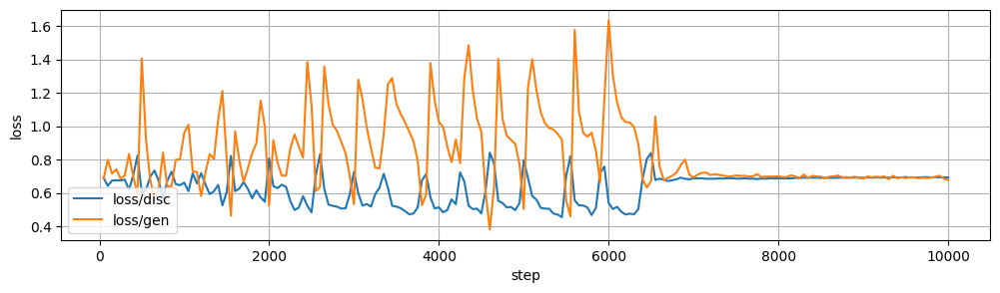

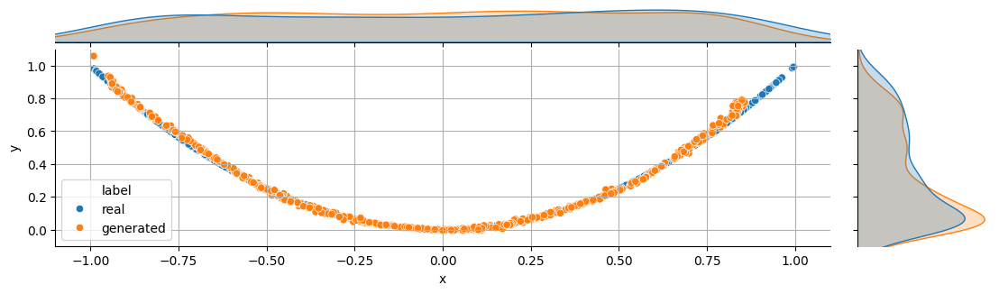

INFO: `Trainer.fit` stopped: `max_epochs=1` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=1` reached.


In [ ]:
pl_model = GAN(generator, discriminator)
trainer = L.Trainer(
    max_epochs=num_epochs,
    logger=L.pytorch.loggers.TensorBoardLogger(save_dir="./log_gan/"),
)

trainer.fit(model=pl_model, train_dataloaders=train_loader)

У нас получилось сгенерировать точки, равномерно распределенные по параболе.

Посмотрим на процесс обучения GAN:

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L13/gan_training_process.gif" width="1000"></center>

[[colab] 🥨 Блокнот с созданием данной Gif-анимации](https://colab.research.google.com/drive/1nFYebZOhK4hLlG95-0PBwlfbJbi-3965)

Видно, как графики функций потерь генератора и дискриминатора осциллируют вокруг положения равновесия, пока не встретятся в этом положении, а распределение сгенерированных данных постепенно становится все более и более похожим на распределение реальных данных.

## DCGAN — Генерация изображений

С помощью **GAN** можно генерировать не только точки на параболе, но и, например, изображения. Но появляются закономерные вопросы.

### Как из шума на входе сети получить изображение?

Самым простым ответом будет: взять шум, пропустить его через **полносвязные слои** и сделать **reshape** до нужного разрешения. В целом, это будет работать.


Однако **DCGAN (Deep Convolutional GAN)** использует **сверточные** и **сверточно-транспонированные** (*convolutional* и *convolutional-transpose*) слои в дискриминаторе и генераторе соответственно. Впервые метод **DCGAN** был описан в статье [Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks (Radford et al., 2015) 🎓[arxiv]](https://arxiv.org/abs/1511.06434).

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/deep_convolutional_gan_scheme.png" width="900"></center>
<center><em>Схема работы DCGAN (Radford et al., 2015)</em></center>

Ниже видна разница в генерации при помощи исключительно **полносвязных слоёв** и при помощи **обратных свёрток**. Видно, что результат **DCGAN** лучше, чем **GAN**.

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L13/gan_dcgan_mnist_examples.png" width="600"></center>
<center><em>Сравнение результатов на MNIST (Radford et al., 2015)</em></center>

<center><em>Source: <a href="https://arxiv.org/pdf/1511.06434.pdf">	Unsupervised representation learning with deep convolutional generative adversarial networks</a></em></center>

### Архитектура DCGAN

На вход генератора подают шум для создания разнообразных объектов. Этот шум представляет собой вектор в многомерном пространстве. Один вектор — один сгенерированный объект. Задача генератора — преобразовать вектор в изображение.

Такое преобразование возможно при помощи транспонированных сверточных (convolution-transpose, иногда называют fractionally strided convolution) слоев или upsample слоев с последующей сверткой.

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/dcgan_architecture.png" width="900"></center>
<center><em>Зеркальная архитектура DCGAN </em></center>

### Пример обученного DCGAN

Давайте посмотрим на пример обученного **DCGAN**.

In [ ]:
import torch

use_gpu = True if torch.cuda.is_available() else False
model = torch.hub.load(
    "facebookresearch/pytorch_GAN_zoo:hub", "DCGAN", pretrained=True, useGPU=use_gpu
)
clear_output()

Распечатаем архитектуру генератора:

In [ ]:
print(model.getNetG())

GNet(
  (formatLayer): ConvTranspose2d(120, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (main): Sequential(
    (batchNorm0): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (convTranspose1): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (batchNorm1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (convTranspose2): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (batchNorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (convTranspose3): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (batchNorm3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (outlayer): ConvTranspo

Распечатаем архитектуру дискриминатора:

In [ ]:
print(model.getNetD())

DNet(
  (main): Sequential(
    (convTranspose3): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (relu3): LeakyReLU(negative_slope=0.2, inplace=True)
    (convTranspose2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (batchNorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): LeakyReLU(negative_slope=0.2, inplace=True)
    (convTranspose1): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (batchNorm1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): LeakyReLU(negative_slope=0.2, inplace=True)
    (convTranspose0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (batchNorm0): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (decisionLayer): Conv2d(512, 21, kern

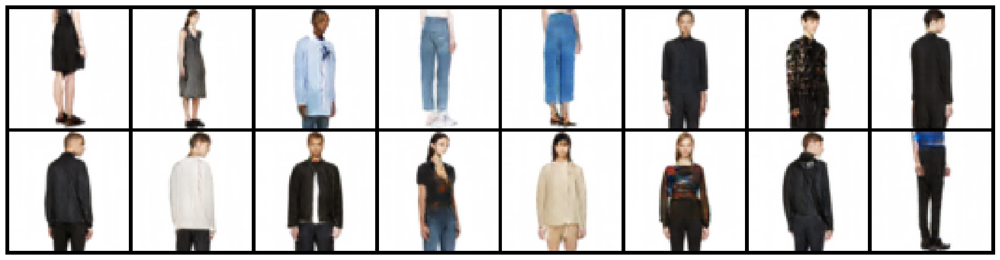

In [ ]:
import torchvision


simplefilter("ignore", category=UserWarning)

num_images = 16
noise, _ = model.buildNoiseData(num_images)
with torch.no_grad():
    generated_images = model.test(noise)
    generated_images = (
        generated_images.clamp(-1, 1) + 1
    ) / 2.0  # normalization to 0..1 range

fig, ax = plt.subplots(figsize=(16 * 3, 2 * 3))
ax.imshow(
    torchvision.utils.make_grid(generated_images).permute(1, 2, 0).cpu().numpy(),
    interpolation="nearest",
    aspect="equal",
)
ax.axis("off")
plt.show()

del model

### Практический пример DCGAN

Теперь давайте попробуем сами написать свой **DCGAN** и обучить его на датасете **FashionMNIST**

In [ ]:
num_epochs = 3  # Num of epochs
batch_size = 64  # batch size
lr = 2e-4  # Learning rate
b1 = 0.5  # Adam: decay of first order momentum of gradient
b2 = 0.999  # Adam: decay of first order momentum of gradient
latent_dim = 100  # latent space
img_size = 32  # images size
channels = 1  # Num of channels

Обычно мы **инициализируем веса** случайным образом, но ничто не мешает нам инициализировать их так, как мы хотим. В [оригинальной статье 🎓[arxiv]](https://arxiv.org/pdf/1511.06434.pdf) про **DCGAN** предложено инициализировать веса нормальным распределением с центром в нуле и стандартным отклонением $0.02$:

In [ ]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm2d") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)
    elif classname.find("Linear") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)

Обратите внимание, как преобразовывается **шум** в **генераторе**:
* сначала с помощью **полносвязного слоя** он увеличивается в размере до **необходимого количества признаков**,
* потом с помощью функции `view` **форма тензора преобразуется** в **размер карты признаков на входе сверточного слоя**,
* потом при прохождении через **сверточные слои** (`conv_blocks`) к нему применяются `ConvTranspose2d`.

In [ ]:
class GeneratorBlock(nn.Module):
    def __init__(self, in_channel, out_channel):
        super().__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose2d(
                in_channel, out_channel, kernel_size=4, stride=2, padding=1
            ),
            nn.BatchNorm2d(out_channel),
            nn.LeakyReLU(0.2, inplace=True),
        )

    def forward(self, x):
        return self.block(x)


class Generator(nn.Module):
    def __init__(self, latent_dim, img_size, channels):
        super(Generator, self).__init__()

        self.init_size = img_size // 2**2
        self.l1 = nn.Sequential(nn.Linear(latent_dim, 128 * self.init_size**2))

        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(128),
            GeneratorBlock(in_channel=128, out_channel=128),
            GeneratorBlock(in_channel=128, out_channel=64),
            nn.Conv2d(64, channels, 3, stride=1, padding=1),
            nn.Tanh(),
        )

    def forward(self, z):
        out = self.l1(z)
        out = out.view(out.shape[0], 128, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img

In [ ]:
class DiscriminatorBlock(nn.Module):
    def __init__(self, in_channel, out_channel, bn=True):
        super().__init__()
        block = [
            nn.Conv2d(in_channel, out_channel, kernel_size=3, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout2d(0.25),
        ]
        if bn:
            block.append(nn.BatchNorm2d(out_channel, 0.8))

        self.block = nn.Sequential(*block)

    def forward(self, x):
        return self.block(x)


class Discriminator(nn.Module):
    def __init__(self, channels):
        super().__init__()

        self.model = nn.Sequential(
            DiscriminatorBlock(channels, 16, bn=False),
            DiscriminatorBlock(16, 32),
            DiscriminatorBlock(32, 64),
            DiscriminatorBlock(64, 128),
        )

        # The height and width of downsampled image
        ds_size = img_size // 2**4
        self.adv_layer = nn.Sequential(nn.Linear(128 * ds_size**2, 1), nn.Sigmoid())

    def forward(self, img):
        out = self.model(img)
        out = out.view(out.shape[0], -1)
        validity = self.adv_layer(out)

        return validity

In [ ]:
set_random_seed(42)
L.seed_everything(42)

# Initialize Generator and Discriminator
generator = Generator(latent_dim=latent_dim, img_size=img_size, channels=channels)
discriminator = Discriminator(channels=channels)

# Initialize weights
generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

pl_model = GAN(
    generator, discriminator, noise_in_place=True, latent_dim=100, lr=lr, betas=(b1, b2)
)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


Напишем функцию для отображения изображений:

In [ ]:
from torchvision.utils import make_grid


def test_image(fake_items, real_items, figsize=(12, 3)):
    grid_fake = (
        make_grid(torch.tensor(fake_items[:10]), nrow=10, normalize=True)
        .permute(1, 2, 0)
        .numpy()
    )

    grid_real = (
        make_grid(torch.tensor(real_items[:10]), nrow=10, normalize=True)
        .permute(1, 2, 0)
        .numpy()
    )

    fig, ax = plt.subplots(2, 1, figsize=figsize)
    ax[0].imshow(grid_fake)
    ax[0].set_axis_off()
    ax[1].imshow(grid_real)
    ax[1].set_axis_off()
    plt.axis("off")
    plt.show()

Загрузим данные в `DataLoader`:

In [ ]:
import os
from torchvision import datasets, transforms

os.makedirs("../../data/mnist", exist_ok=True)
data_loader = torch.utils.data.DataLoader(
    datasets.FashionMNIST(
        "../../data/mnist",
        train=True,
        download=True,
        transform=transforms.Compose(
            [
                transforms.Resize(img_size),
                transforms.ToTensor(),
                transforms.Normalize([0.5], [0.5]),
            ]
        ),
    ),
    batch_size=batch_size,
    shuffle=True,
)
clear_output()

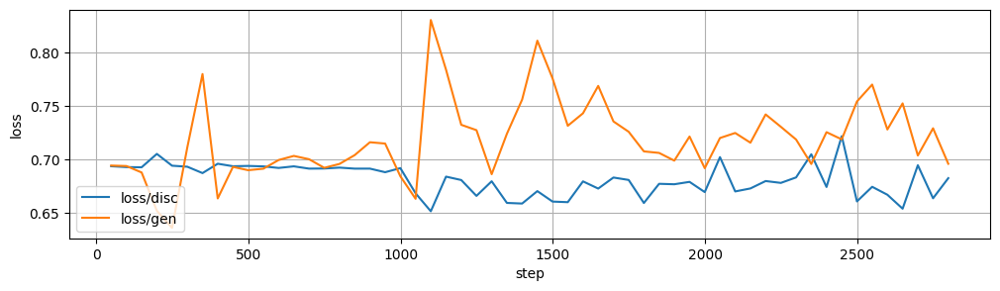

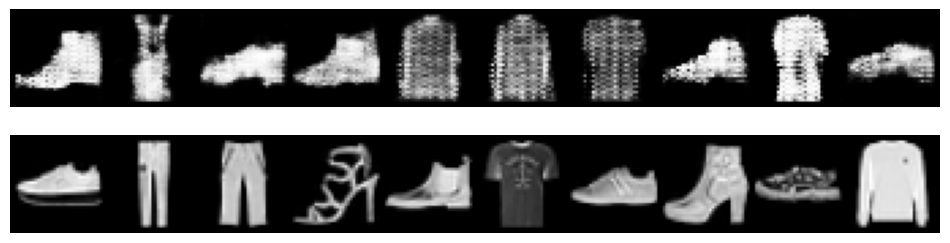

INFO: `Trainer.fit` stopped: `max_epochs=3` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.


In [ ]:
trainer = L.Trainer(
    max_epochs=num_epochs,
    logger=L.pytorch.loggers.TensorBoardLogger(save_dir="./log_cgan/"),
)

trainer.fit(model=pl_model, train_dataloaders=data_loader)

Мы проучили модель 3 эпохи. Видно, что функции потерь генератора и дискриминатора не только не сошлись, но начали расходиться. При этом на сгенерированных изображениях присутствует характерная рябь. Если увеличить количество эпох, качество генерируемых изображений улучшится, но эффект расхождения функций потерь только усилится.

Такая ситуация происходит чаще, чем нам бы хотелось. Ниже показаны кривые обучения простого GAN на датасете MNIST.

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L13/gan_loss.png" width="600"></center>

<center><em>Кривые обучения простого GAN на датасете MNIST</em></center>

<center><em>Source: <a href="https://github.com/znxlwm/pytorch-generative-model-collections"> Pytorch implementation of various GANs</a></em></center>

## Тонкости обучения GAN

[[blog] ✏️ Детальный разбор тонкостей и советов](https://beckham.nz/2021/06/28/training-gans.html)

### Проблема больших градиентов

Одной из причин проблем со сходимостью GAN являются большие градиенты дискриминатора, которые приводят к сбою настроек генератора.

В статье [Wasserstein GAN 🎓[arxiv]](https://arxiv.org/pdf/1701.07875.pdf) показано, что обеспечение плавности ([k-Липшицевости 📚[wiki]](https://en.wikipedia.org/wiki/Lipschitz_continuity)) изменения параметров дискриминатора улучшает сходимость GAN. Есть несколько подходов к обеспечению такой плавности. Ниже приведем некоторые из них.

- Регуляризация:
    - **Weight clipping** — клиппинг (ограничение максимального и минимального значений) весов. Может давать [чрезмерно сильную регуляризацию ✏️[blog]](https://beckham.nz/2021/06/28/training-gans.html).
    - **Gradient penalty** — штраф за слишком большой или слишком маленький градиент (оптимальным выбран градиент с единичной нормой). [Cтатья 🎓[arxiv]](https://arxiv.org/pdf/1704.00028.pdf). [Код 🐾[git]](https://github.com/EmilienDupont/wgan-gp). Вычислительно сложная операция.
    - Спектральная нормализация. Вычислительно дешевый [аналог gradient penalty ✏️[blog]](https://beckham.nz/2021/06/28/training-gans.html). [Cтатья 🎓[arxiv]](https://arxiv.org/pdf/1802.05957.pdf). Код — ниже.
- Изменение функции потерь:
    - Замена Cross-Entropy Loss на [**расстояние Вассерштейна** 📚[wiki]](https://en.wikipedia.org/wiki/Wasserstein_metric) —  уход от неограниченно больших градиентов при уверенности дискриминатора, что сгенерированный объект — фейк. Применяется совместно с **weight clipping** или **gradient penalty**. [Cтатья 🎓[arxiv]](https://arxiv.org/pdf/1701.07875.pdf). [Реализация 🐾[git]](https://github.com/znxlwm/pytorch-generative-model-collections/blob/master/WGAN.py).
    - Переход на сравнение статистик карт признаков.  [Cтатья 🎓[article]](https://proceedings.neurips.cc/paper_files/paper/2016/file/8a3363abe792db2d8761d6403605aeb7-Paper.pdf). [Реализация 🐾[git]](https://github.com/openai/improved-gan).

- **Top-k Training:** отказ от обучения на плохих примерах. Градиент пропускается только через top-k наилучшим способом сгенерированных объектов. Объекты с большими градиентами отбрасываются. [Cтатья 🎓[arxiv]](https://arxiv.org/abs/2002.06224).


Ни один из этих методов не является универсальным.
Мы попробуем применить к нашей модели спектральную нормализацию:

In [ ]:
from torch.nn.utils import spectral_norm


def add_spectral_norm(m):
    if isinstance(m, nn.Linear) or isinstance(m, torch.nn.Conv2d):
        m = spectral_norm(m)

In [ ]:
set_random_seed(42)
L.seed_everything(42)

# Initialize Generator and Discriminator
generator = Generator(latent_dim=latent_dim, img_size=img_size, channels=channels)

discriminator = Discriminator(channels=channels)

# Initialize weight
generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

discriminator.apply(add_spectral_norm)

pl_model = GAN(
    generator, discriminator, noise_in_place=True, latent_dim=100, lr=lr, betas=(b1, b2)
)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


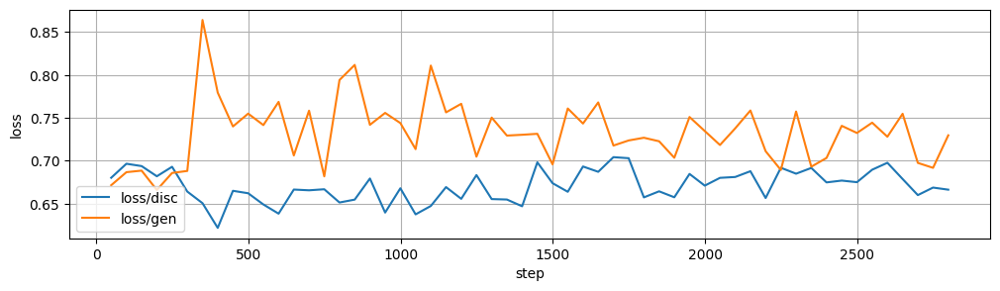

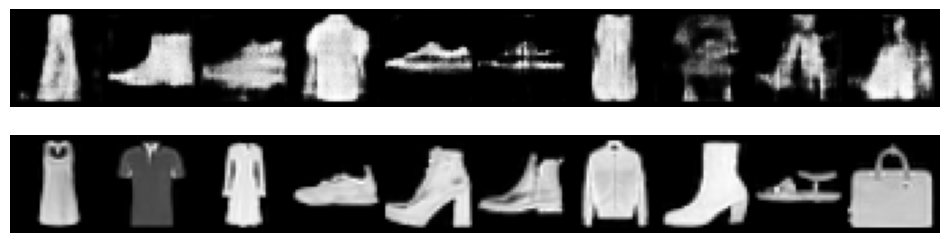

INFO: `Trainer.fit` stopped: `max_epochs=3` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.


In [ ]:
trainer = L.Trainer(
    max_epochs=num_epochs,
    logger=L.pytorch.loggers.TensorBoardLogger(save_dir="./log_cgan/"),
)

trainer.fit(model=pl_model, train_dataloaders=data_loader)

График функции потерь меняется более устойчиво. Нет ряби на изображениях. При увеличении количества эпох качество станет еще лучше.

### Другие особенности

[[git] 🐾 How to Train a GAN? Tips and tricks to make GANs work](https://github.com/soumith/ganhacks/)

**Простые ошибки**:
- Обратите внимание, что сгенерированные объекты должны быть в том же числовом диапазоне и иметь тот же размер, что и реальные данные.
- При использовании `BatchNorm` следите, чтобы  real и fake батчи [поступали на дискриминатор отдельно 🐾[git]](https://github.com/soumith/ganhacks/?tab=readme-ov-file#4-batchnorm). При небольшом количестве объектов в батче или странном поведении модели в тестовом режиме лучше использовать `InstanceNorm`.

**Нужно ли давать преимущество дискриминатору?**

Один из самых старых и распространенных советов при обучении GAN — давать преимущество дискриминатору. Это означает, например, что параметры дискриминатора обновляются чаще, чем параметры генератора. В большинстве случаев ограничение градиентов работает не хуже, чем такая нетривиальная организация процесса обучения, а делается проще.


**Оптимизатор:**

В большинстве статей про **GAN** используется **ADAM**. В [статье 🎓[arxiv]](https://arxiv.org/pdf/1802.05957.pdf) проведено исследование по поиску оптимальных параметров оптимизатора: для большинства архитектур $\beta_1 = 0.5, \beta_2 = 0.999, \text{lr} = 2\cdot 10^{-4}$ — хорошая отправная точка для обучения.

Параметр `epsilon` **ADAM** по умолчанию в PyTorch равен `1e-8`, что может вызвать проблемы после длительного периода обучения, например, резкий рост значений функции потерь. Для борьбы с этим параметр `epsilon` можно увеличить, например, до `1e-3`. Подробнее об этом на [StackOverflow ✏️[blog]](https://stackoverflow.com/questions/42327543/adam-optimizer-goes-haywire-after-200k-batches-training-loss-grows) и в комментарии на [Reddit ✏️[blog]](https://www.reddit.com/r/reinforcementlearning/comments/j9rflf/intuitive_explanation_for_adams_epsilon_parameter/).

## Метрики генерации

Для того, чтобы улучшить генерацию, нам нужно понять, что значит лучше. Для этого нам нужно определиться с метриками. Одной из проблем генерации является **mode collapse** — ситуация, когда модель выдает одно и то же изображение или один и тот же класс и т. д., независимо от того, какие входные данные ей подаются.

Ниже представлен пример с данными, представляющими собой 8 кластеров из гауссовых распределений. Верхняя строка — успешное обучение, нижняя — mode collapse.

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L13/mode_collapse_example.png" width="900"></center>

<center><em>Обучение  GAN на смеси двумерных гауссиан. Верхняя строка — успешное обучение, нижняя — mode collapse.</em></center>

<center><em>Source: <a href="https://arxiv.org/pdf/1611.02163.pdf">Unrolled Generative Adversarial Networks</a></em></center>

Посмотрим на это с точки зрения распределений:

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L13/mode_collapse_in_gan.png" width="850"></center>

<center><em>Mode collapse в GAN (a) — с точки зрения распределения, (b) — с точки зрения сгенерированных изображений.</em></center>

<center><em>Source: <a href="https://www.researchgate.net/publication/354203725_Modified_generative_adversarial_networks_for_image_classification">Modified generative adversarial networks for image classification</a></em></center>

С точки зрения распределений mode collapse случается, когда модель повторяет только часть сложного распределения целевых данных.

 ### Inception Score

Для определения качества генерации мы бы хотели оценивать два свойства сгенерированной коллекции изображений:
- качество изображения: похоже ли сгенерированное изображение на какой-то конкретный объект или это шум?
- разнообразие изображений: не происходит ли mode collapse?


Один из способов проверить оба свойства — использовать **Inception Score**. **Inception Score** — это способ оценки качества генерации с использованием сети Inception-v3, обученной на ImageNet (1000 классов), предложенный в статье [Improved Techniques for Training GANs 🎓[arxiv]](https://arxiv.org/pdf/1606.03498.pdf) в 2016 году.


<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L13/inception_v3_architecture.png" width="900"></center>

<center><em>Архитектура Inception-v3</em></center>

<center><em>Source: <a href="https://paperswithcode.com/method/inception-v3">Rethinking the Inception Architecture for Computer Vision</a></em></center>

Оцениваемые изображения прогоняются через сеть Inception-v3. На выходе сети — вероятности для 1000 классов $p(y|x)$, где $x$ — входное изображение, $y$ — метка класса.
- Для оценки качества изображения: сгенерированное изображение должно с высокой вероятностью относиться к одному из классов. Это значит, что энтропия $p(y|x)$ должна быть низкой:

$$H = -\sum_{i}p_i\log{p_i}$$

- Для оценки разнообразия: мы хотим, чтобы предсказываемые метки классов были как можно более разнообразными. Это значит, что мы должны максимизировать энтропию $\int{p(y|x=G(z))dz}$.

Эти два условия могут быть [объединены ✏️[blog]](https://machinelearningmastery.com/how-to-implement-the-inception-score-from-scratch-for-evaluating-generated-images/) через [дивергенцию Кульбака-Лейблера 📚[wiki]](https://en.wikipedia.org/wiki/Kullback%E2%80%93Leibler_divergence) в Inception Score:

$$\text{IS} = \exp(\mathbb{E}_x\text{KL}(p(y|x)||p(y)))$$

Минимальное значение $\text{IS}$ — 1, максимальное (для Inception-v3, обученной на ImageNet) — 1000. Чем **выше качество генерации** и больше вариативность, тем **выше Inception Score**.

Проблемы **Inception Score**:
 - Значение **Inception Score** зависит от применяемой модели Inception-v3: они могут быть написаны на различных библиотеках, обучаться с разной точностью вычислений на различных устройствах с различной инициализацией.
 - Inception-v3 обучена на ImageNet, она адекватно работает на датасетах с похожими данными, например, на тестовой выборке датасета CIFAR-10 она дает значение порядка 11, что близко к количеству исходных данных. Но для оценки, например, медицинских данных имеет смысл использовать собственный классификатор.
 - Inception-v3 обучена на 3-хканальных изображениях с размером 299×299 и может некорректно работать с другими форматами.

### Frechet Inception Distance (FID)

Более поздней [модификацией 🎓[arxiv]](https://arxiv.org/pdf/1706.08500.pdf)  Inception Score является Frechet Inception Distance. Эта метрика использует [расстояние Фреше 📚[wiki]](https://ru.wikipedia.org/wiki/%D0%A0%D0%B0%D1%81%D1%81%D1%82%D0%BE%D1%8F%D0%BD%D0%B8%D0%B5_%D0%A4%D1%80%D0%B5%D1%88%D0%B5) (метрика сходства кривых) для оценки разницы между распределением высокоуровневых признаков, извлекаемых Inception-v3 для реальных и сгенерированных изображений.
Т. к. FID использует метрику расстояния, **чем меньше  FID — тем лучше**.

Эта метрика меньше привязана к ImageNet, т. к. рассматривает распределение высокоуровневых признаков, а не предсказываемых классов, но также зависит от версии библиотек.

Кроме того, у нее есть особенность: если вместо того, чтобы научиться генерировать новые изображения, модель выучит все изображения из обучающей выборки, значение FID будет очень низким, а если сравнивать с train данными — нулевым, поэтому важно сравнивать с отложенной выборкой (о чем иногда забывают).

[[git] 🐾 Другие метрики генерации](https://github.com/yhlleo/GAN-Metrics)

### Пример расчета метрик

Попробуем посчитать метрики для [предобученного на CIFAR-10 GAN 🐾[git]](https://github.com/csinva/gan-vae-pretrained-pytorch). Для этого клонируем код из репозитория.

In [ ]:
!git clone -q https://github.com/csinva/gan-vae-pretrained-pytorch.git

Создадим модель (нам нужен только генератор).

In [ ]:
import sys

sys.path.append("/content/gan-vae-pretrained-pytorch")

In [ ]:
from cifar10_dcgan.dcgan import Generator

generator = Generator(ngpu=1)

Подгрузим веса модели:

In [ ]:
import torch

generator.load_state_dict(
    torch.load(
        "/content/gan-vae-pretrained-pytorch/cifar10_dcgan/weights/netG_epoch_199.pth",
        map_location=torch.device("cpu"),
    )
)

<All keys matched successfully>

Попробуем сгенерировать данные. Для этого пропишем денормализацию: автор кода использовал `mean=(0.5, 0.5, 0.5)` и `std=(0.5, 0.5, 0.5)` (не лучший выбор для CIFAR-10).

In [ ]:
import torchvision.transforms as transforms

batch_size = 16
nz = 100

denormalization = transforms.Compose(
    [
        transforms.Normalize(mean=[0.0, 0.0, 0.0], std=[1 / 0.5, 1 / 0.5, 1 / 0.5]),
        transforms.Normalize(mean=[-0.5, -0.5, -0.5], std=[1.0, 1.0, 1.0]),
    ]
)

noise = torch.randn(batch_size, nz, 1, 1)
imgs = denormalization(generator(noise))
imgs = (imgs * 255).type(torch.uint8)

Посмотрим на результат генерации:

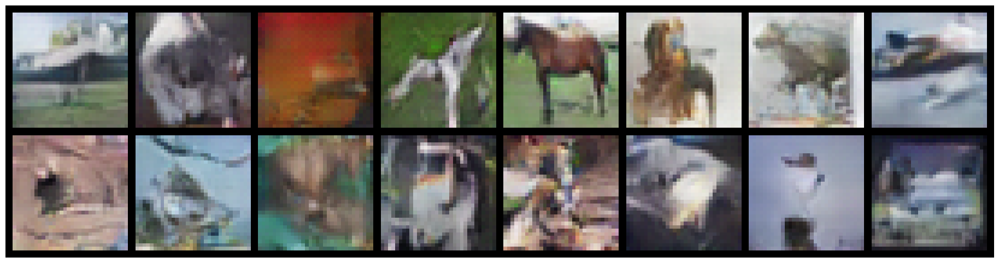

In [ ]:
import torchvision
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(16 * 3, 2 * 3))
ax.imshow(
    torchvision.utils.make_grid(imgs).permute(1, 2, 0).cpu().numpy(),
    interpolation="nearest",
    aspect="equal",
)
ax.axis("off")
plt.show()

Загрузим тестовый датасет от CIFAR-10:

In [ ]:
from torchvision import datasets

test_dataset = datasets.CIFAR10(
    "content", train=False, download=True, transform=transforms.ToTensor()
)

test_loader = torch.utils.data.DataLoader(
    test_dataset, batch_size=32, shuffle=False, drop_last=False, num_workers=2
)

100%|██████████| 170498071/170498071 [00:12<00:00, 13227034.19it/s]


Extracting content/cifar-10-python.tar.gz to content


Для расчета будем использовать метрики из `torchmetrics`, для корректной работы нужно сначала установить `torchmetrics[image]`, а потом `lightning`:

In [ ]:
from IPython.display import clear_output

!pip install -q --upgrade diffusers transformers accelerate
!pip install -q torchmetrics[image]
!pip install -q lightning

clear_output()

 При работе с метриками генерации из `torchmetrics` есть ряд особенностей:
- `InceptionScore` и `FrechetInceptionDistance` работают с трехканальными изображениями `[batch, 3, 299, 299]` типа `torch.uint8`. Изменение размера метрика делает автоматически, а количество каналов и тип данных — наша забота.
- Параметр `feature` позволяет выбирать, из какой части модели берутся признаки. Вместо чисел туда можно передавать собственный экстрактор признаков типа `nn.Module`.
- Метрики рекомендуется использовать внутри `L.LightningModule` с включенной GPU, тогда вычисления происходят быстрее.

In [ ]:
import lightning as L

from torchmetrics import MetricCollection
from torchmetrics.image.inception import InceptionScore
from torchmetrics.image.fid import FrechetInceptionDistance


class RunMetric(L.LightningModule):
    def __init__(self, generator, noise_gen, detransform):
        super().__init__()
        # model
        self.generator = generator
        self.noise_gen = noise_gen
        self.detransform = detransform

        # metrics
        self.is_real = InceptionScore()
        self.is_fake = InceptionScore()

        self.fid = MetricCollection(
            {
                "FID_64": FrechetInceptionDistance(feature=64),
                "FID_192": FrechetInceptionDistance(feature=192),
                "FID_768": FrechetInceptionDistance(feature=768),
                "FID_2048": FrechetInceptionDistance(feature=2048),
            }
        )

    def test_step(self, batch, batch_idx):
        real, _ = batch
        batch_size = real.shape[0]
        noise = self.noise_gen(batch_size).to(self.device)
        fake = self.generator(noise)
        fake = self.detransform(fake)

        real = (real * 255).type(torch.uint8)
        fake = (fake * 255).type(torch.uint8)

        self.fake = fake

        self.is_real.update(real)
        self.is_fake.update(fake)

        self.fid.update(real, real=True)
        self.fid.update(fake, real=False)

    def on_test_epoch_end(self):
        is_real = self.is_real.compute()[0]
        self.log("IS_real", is_real.item())
        self.is_real.reset()

        is_fake = self.is_fake.compute()[0]
        self.log("IS_fake", is_fake.item())
        self.is_fake.reset()

        fid = self.fid.compute()
        self.log_dict(fid)
        self.fid.reset()

        fig, ax = plt.subplots(figsize=(16 * 3, 2 * 3))
        ax.imshow(
            torchvision.utils.make_grid(self.fake).permute(1, 2, 0).cpu().numpy(),
            interpolation="nearest",
            aspect="equal",
        )
        ax.axis("off")
        plt.show()

In [ ]:
def noise_gen(batch_size, nz=100):
    return torch.randn(batch_size, nz, 1, 1)

In [ ]:
!mkdir /content/lightning_logs

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

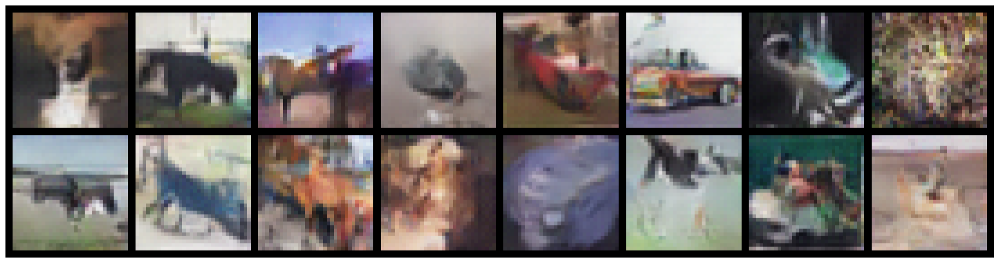

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          FID_192          │    1.6677896976470947     │
│         FID_2048          │     38.30153274536133     │
│          FID_64           │    0.2528168261051178     │
│          FID_768          │    0.27971649169921875    │
│          IS_fake          │     6.492356300354004     │
│          IS_real          │    10.979336738586426     │
└───────────────────────────┴───────────────────────────┘

In [ ]:
from warnings import simplefilter

simplefilter("ignore", category=RuntimeWarning)

L.seed_everything(42)

pl_model = RunMetric(generator, noise_gen, denormalization)
clear_output()
trainer = L.Trainer(max_epochs=0)
metrics = trainer.test(model=pl_model, dataloaders=test_loader)

Значение IS для тестовых данных CIFAR-10 около 11, для сгенерированных данных — 6.5. Это значит, что качеству генерации есть куда расти (по сгенерированным изображениям это видно), что касается FID — чтобы сравнить модели, нужно обучить несколько. Чем меньше FID, тем лучше.

## cGAN — GAN с условием

**cGAN** расшифровывается как **Conditional Generative Adversarial Network** — это **GAN** с условием. Условие может быть любым, например, генерация конкретной цифры. В этом случае нам нужен уже размеченный датасет для того, чтобы обучить Conditional GAN.

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/conditional_gan_scheme.png" width="700"></center>
<center><em>Схема работы cGAN. Label Y добавляется к случайному шуму, тем самым мы говорим генератору генерировать случайное изображение нужного класса. Также он подаётся в дискриминатор в качестве входа, чтобы дискриминатор знал, какое изображение классифицировать как реальное, а какое — как сгенерированное.</em></center>

Обучение в данном случае будет аналогичным обучению **GAN**: мы будем обучать сети, чередуя реальные данные и сгенерированные, добавив `label`.

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L13/cgans_results_20_and_50_epochs_mnist.png" width="600"></center>
<center><em>Сравнение результатов cGAN и cDCGAN</em></center>

<center><em>Source: <a href="https://arxiv.org/pdf/1511.06434.pdf">Unsupervised Representation Learning with Deep Convolutional Generative Adversial Networks</a></em></center>



### Кодирование меток классов

Поскольку подавать в сеть числа от 0 до 9 (в случае **MNIST**) нет смысла, нужно придумать, как подавать их в нейронную сеть. На помощь приходят **Embeddings**. Мы можем представить каждую метку в виде вектора из, например, 128 компонент.

[[doc] 🛠️](https://pytorch.org/docs/stable/generated/torch.nn.Embedding.html) `nn.Embedding`

In [ ]:
samples, labels = next(iter(data_loader))

label_emb = nn.Embedding(10, 128)

e = label_emb(labels)

print(f"Label: {labels[0]}")
print(f"Embedding for this label has shape: {e[0].shape}")

Label: 3
Embedding for this label has shape: torch.Size([128])


После этого **эмбеддинги** меток обычно конкатенируются с входами сетей.

**Почему нельзя подать просто число?**

Если мы будем подавать просто число, например, $0.1$ для единицы и $0.5$ для пяти, то вход у нас будет непрерывным, что довольно нелогично: тогда при небольшом изменении входа мы будем генерировать другую цифру. А также сети будет сложнее выучить небольшие расхождения в этом небольшом интервале. В случае с векторным представлением мы избегаем этих проблем.

## Модификации GAN

Существует множество способов модификации GAN. Например, можно подмешивать метки классов только в дискриминатор, как сделано в [**Semi-Supervised GAN** 🎓[arxiv]](https://arxiv.org/pdf/1606.01583.pdf). В нем дискриминатор делает классификацию не на $2$ класса **[real, fake]**, а на $n+1$ класс **[real 1, real 2, …, real n, fake]**, где $n$ — количество классов в исходном датасете.

Другие модификации и пример кода с ними:
* [[git] 🐾 PyTorch Generative Model Collections](https://github.com/znxlwm/pytorch-generative-model-collections)
* [[git] 🐾 PyTorch-GAN](https://github.com/eriklindernoren/PyTorch-GAN).

Также стоит отметить добавление модификаций исходного латентного пространства — **Style GAN**. Именно они позволили генерировать фотореалистичные изображения с  минимальным количеством артефактов. [Примеры изображений ✏️[blog]](https://nvlabs.github.io/stylegan3/).

Статьи про модификации GAN'ов:

* [[arxiv] 🎓 A Style-Based Generator Architecture for Generative Adversarial Networks (StyleGAN) (Karras et al., 2018)](https://arxiv.org/abs/1812.04948)
* [[arxiv] 🎓 Analyzing and Improving the Image Quality of StyleGAN (StyleGAN2) (Karras et al., 2019)](https://arxiv.org/abs/1912.04958)
* [[arxiv] 🎓 Alias-Free Generative Adversarial Networks (Alias-Free GAN) (Karras et al., 2021)](https://arxiv.org/abs/2106.12423)

# Диффузионные модели

Базовая публикация по теме: [Denoising Diffusion Probabilistic Models (Ho et al., 2020) 🎓[arxiv]](https://arxiv.org/abs/2006.11239).

В GAN мы преобразовывали шум в целевой объект в один шаг с использованием сложной функции — генератора, и задача обучения GAN состояла в обучении этой функции.

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/gan_transform_idea.png" width="350"></center>

Идея диффузии состоит в том, чтобы делать это не за один шаг, а за много маленьких шагов.

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/diffusion_process.png" width="1000"></center>

## Прямой диффузионный процесс

Пусть мы имеем некоторый объект $\mathbf{x}_0$ из заданного имеющимся датасетом распределения $\mathbf{x}_0 \sim q(\mathbf{x})$. Определим так называемый прямой диффузионный процесс, в ходе которого мы будем последовательно добавлять небольшое количество Гауссового шума последовательно $T$ раз, создавая из нашего объекта последовательность $\mathbf{x}_1, \dots, \mathbf{x}_T$ постепенно всё более зашумленных версий нашего исходного объекта:

$$\large \mathbf{x_t} = \sqrt{1-\beta_t}\mathbf{x_{t-1}}+\sqrt{\beta_t}\mathbf{n_{t-1}},$$

где $\mathbf{n_{t-1}} \sim \mathcal{N}(\mathbf{0}, \mathbf{I})$, а $\beta_t$ — дисперсия добавляемого на $t$-ом шаге шума.

Параметры добавляемого шума зависят от номера шага зашумления. Набор $\{\beta_t \in (0, 1)\}_{t=1}^T$ именуется планировщиком зашумления и задается заранее. В конце зашумления получаем нормальный шум: $\mathbf{x_T} \sim \mathcal{N}(\mathbf{0}, \mathbf{I})$.

Посмотрим, как это будет выглядеть на различных изображениях:

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L13/denoising_diffusion_example.jpg" width="1000"></center>

<center><em>Прямой диффузионный процесс, T=1000</em></center>

<center><em>Source: <a href="https://learnopencv.com/denoising-diffusion-probabilistic-models/">An In-Depth Guide to Denoising Diffusion Probabilistic Models – From Theory to Implementation</a></em></center>

Исходное распределение данных из датасета будет последовательно преобразовано в Гауссов шум:

$$ \large
q(\mathbf{x}_{1:T} \vert \mathbf{x}_0) = \prod^T_{t=1} q(\mathbf{x}_t \vert \mathbf{x}_{t-1})$$

$$\large q(\mathbf{x}_t \vert \mathbf{x}_{t-1}) = \mathcal{N}(\mathbf{x}_t; \sqrt{1 - \beta_t} \mathbf{x}_{t-1}, \beta_t\mathbf{I}) \quad$$




### Причина использования Гауссова шума

Важным свойством Гауссова распределения является то, что оно допускает аналитическое вычисление параметров шума на любом из шагов процесса в явном виде. Это связано с тем, что сумма нескольких нормально распределенных случайных величин также является случайной величиной с нормальным распределением. Это значит, что **во время обучения модели для подготовки данных нам не нужно будет делать до $T$ шагов зашумления**.

Для этого удобно ввести обозначение $\large \alpha_t = 1 - \beta_t$. Тогда один шаг прямого диффузионного процесса будет выражаться так:

$$ \large \mathbf{x}_t= \sqrt{\alpha_t}\mathbf{x}_{t-1} + \sqrt{1 - \alpha_t}\mathbf{n}_{t-1}$$

Можно показать, что для $\large t$-го шага прямого диффузионного процесса зашумленное изображение $\large \mathbf{x}_t$ выражается через исходное изображение $\large \mathbf{x}_0$ следующим образом:

$$ \large \mathbf{x}_t = \sqrt{\overline{\alpha}_t}\mathbf{x}_0 + \sqrt{1 - \overline{\alpha}_t}\bar{\mathbf{n}}_{0}, $$

где $\large \bar{\alpha}_t = \prod_{s=1}^t \alpha_s$, а  $\large \bar{\mathbf{n}}_{0} \sim \mathcal{N}(\mathbf{0}, \mathbf{I})$.

На практике можно использовать другие методы зашумления/деградации изображения, которые больше подходят под ваши данные.

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L13/diffusion_models_results.png" width="1000"></center>
<center><em>Результат работы диффузионных моделей, использующих различные типы деградации/зашумления изображения</em></center>

<center><em>Source: <a href="https://arxiv.org/pdf/2208.09392.pdf">Cold Diffusion: Inverting Arbitrary Image Transforms Without Noise</a></em></center>

### Планировщик зашумления

В [оригинальной статье 🎓[arxiv]](https://arxiv.org/pdf/2006.11239.pdf) используется линейный планировщик зашумления:

In [ ]:
import locale

locale.getpreferredencoding = lambda: "UTF-8"
!pip install -q --upgrade transformers accelerate

In [ ]:
import torch


def linear_beta_schedule(timesteps):
    beta_start = 1e-4
    beta_end = 0.02
    return torch.linspace(beta_start, beta_end, timesteps)

Посмотрим, как меняются $β$ и $\overline{\alpha}_t$:


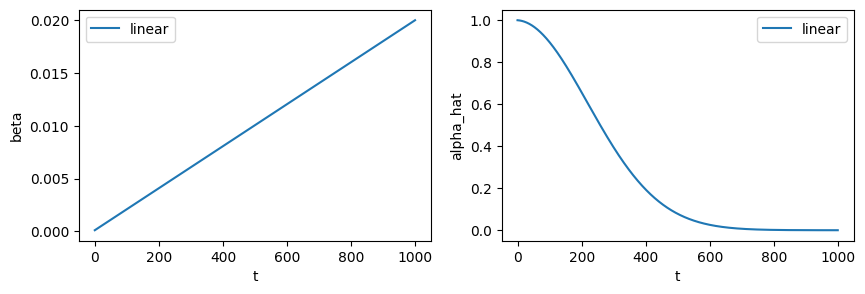

In [ ]:
import matplotlib.pyplot as plt

T = 1000
beta_linear = linear_beta_schedule(T)
alpha_linear = 1.0 - beta_linear
# \hat{\alpha}_{i-1} = \prod_{j=0}^{i-1} \alpha_j
alpha_hat_linear = torch.cumprod(alpha_linear, dim=0)

fig, axs = plt.subplots(1, 2, figsize=(10, 3))
axs[0].plot(beta_linear, label="linear")
axs[0].set_xlabel("t")
axs[0].set_ylabel("beta")
axs[0].legend()

axs[1].plot(alpha_hat_linear, label="linear")
axs[1].set_xlabel("t")
axs[1].set_ylabel("alpha_hat")
axs[1].legend()

plt.show()

$\overline{\alpha}_t$ меняется сильно нелинейно. В [более поздней статье 🎓[arxiv]](https://arxiv.org/pdf/2102.09672.pdf) предложен косинусный планировщик зашумления:

In [ ]:
def cosine_beta_schedule(timesteps, s=0.008):
    """
    cosine schedule as proposed in https://arxiv.org/abs/2102.09672
    """
    steps = timesteps + 1
    x = torch.linspace(0, timesteps, steps)
    alphas_cumprod = torch.cos(((x / timesteps) + s) / (1 + s) * torch.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return torch.clip(betas, 0.0001, 0.9999)

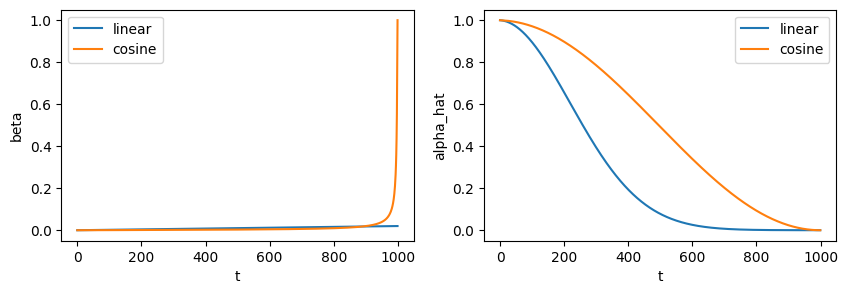

In [ ]:
T = 1000
beta_cosine = cosine_beta_schedule(T)
alpha_cosine = 1.0 - beta_cosine
# \hat{\alpha}_{i-1} = \prod_{j=0}^{i-1} \alpha_j
alpha_hat_cosine = torch.cumprod(alpha_cosine, dim=0)

fig, axs = plt.subplots(1, 2, figsize=(10, 3))
axs[0].plot(beta_linear, label="linear")
axs[0].plot(beta_cosine, label="cosine")
axs[0].set_xlabel("t")
axs[0].set_ylabel("beta")
axs[0].legend()

axs[1].plot(alpha_hat_linear, label="linear")
axs[1].plot(alpha_hat_cosine, label="cosine")
axs[1].set_xlabel("t")
axs[1].set_ylabel("alpha_hat")
axs[1].legend()

plt.show()

Изменение $\overline{\alpha}_t$ для косинусного планировщика более линейно.
В [статье 🎓[arxiv]](https://arxiv.org/pdf/2102.09672.pdf) показано, что такая форма минимизирует Negative Log-Likelihood, что приводит к улучшению качества изображения. Визуально зашумление изображения с использованием косинусного планировщика кажется более равномерным:



<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L13/linear_cosine_schedules.png" width="950"></center>

<center><em>Результат работы линейного (верх) и косинусного (низ) планировщиков зашумления</em></center>

<center><em>Source: <a href="https://arxiv.org/pdf/2102.09672.pdf">Improved Denoising Diffusion Probabilistic Models</a></em></center>

## Обратный диффузионный процесс

$$\large p_\theta(\mathbf{x}_{0:T}) = p(\mathbf{x}_T) \prod^T_{t=1} p_\theta(\mathbf{x}_{t-1} \vert \mathbf{x}_t) \quad
p_\theta(\mathbf{x}_{t-1} \vert \mathbf{x}_t) = \mathcal{N}(\mathbf{x}_{t-1}; \boldsymbol{\mu}_\theta(\mathbf{x}_t, t), \boldsymbol{\Sigma}_\theta(\mathbf{x}_t, t))$$

Целью обратного диффузионного процесса является “расшумление” изображения. Для осуществления данного процесса используется нейросеть, об архитектуре которой мы поговорим позже. Пока нам нужно определиться с входом и выходом сети и функцией ошибок:
- На вход модели поступают зашумленное изображение $\mathbf{x}_t = \sqrt{\overline{\alpha}_t}\mathbf{x}_0 + \sqrt{1 - \overline{\alpha}_t}\bar{\mathbf{n}}_{0} $
и текущий шаг $t$. Модель пытается предсказать **весь добавленный шум** $\bar{\mathbf{n}}_{0}$ (так она работает более устойчиво).
- На выходе предсказываемый моделью шум $\bar{\mathbf{n}}_{0} \sim \mathcal{N}(\mathbf{0}, \mathbf{I})$. Мы не изменяем дисперсию предсказываемого шума от номера шага — он всегда в одном диапазоне.
- В качестве функции ошибок используется MSE:

$$\large \text{Loss} = \text{MSE}(\bar{\mathbf{n}}_{0}, \mathbf{n}_θ(x_t, t)).$$

- В одном батче на обучение присутствуют разные картинки $\mathbf{x}$ на разных стадиях зашумления $t$.

Подробное математическое обоснование:
* [[arxiv] 🎓 Denoising Diffusion Probabilistic Models (Ho et al., 2020)](https://arxiv.org/pdf/2006.11239.pdf)
* [[blog] ✏️ What are Diffusion Models?](https://lilianweng.github.io/posts/2021-07-11-diffusion-models)

## Процесс генерации

Процесс генерации происходит по следующему алгоритму:
1. В начале семплируется $\mathbf{x_T} \sim \mathcal{N}(\mathbf{0}, \mathbf{I})$.
2. В цикле по $t = T, ..., 1$:

 3. Если $t>1$, семплируется $\bar{\mathbf{n}}_{t-1} \sim \mathcal{N}(\mathbf{0}, \mathbf{I})$, иначе $\bar{\mathbf{n}}_{t-1}= \mathbf{0}$

 4. С помощью модели предсказывается $ \mathbf{n}_θ(x_t, t)$.

 5. Вычисляется "расшумленная на один шаг" версия изображения:
$$\large \mathbf{x}_{t-1} = \dfrac{1}{\sqrt{\alpha_t}}\left(\mathbf{x}_t - \dfrac{1 - \alpha_t}{\sqrt{1 - \overline{\alpha}_t}} \mathbf{n}_θ(x_t, t)\right) + \sqrt{\beta_t}\bar{\mathbf{n}}_{t-1}$$

    
6. На выходе из цикла имеем полностью "расшумленное" изображение $\large \mathbf{x}_0$.



Внутри шага 5 можно рассмотреть следующую идею: сначала из изображения на шаге $t$ вычитается весь предсказанный на этом шаге шум (выражение внутри скобок), а затем к результату добавляется следующая порция шума.

Идейно это очень похоже на процесс рисования: мы грубо рисуем контуры, частично их стираем и уточняем.

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/diffusion_idea.png" width="1000"></center>

## Denoising U-Net

Архитектура  Denoising U-Net представлена на картинке ниже. Это уже знакомый нам из лекции по сегментации U-Net с привычными skip connections между картами признаков энкодера и декодера (рыжие стрелки и надпись concatenate). На входе сети — зашумленное изображение, на выходе — предсказанный шум.

В качестве базового блока используются ResNet блоки. Из архитектурных добавлений:
- блоки Self-Attention,
- примешивание эмбеддинга текущего шага генерации $t$ при каждом изменении размера.

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L13/denoising_unet_architecture.png" width="800"></center>

<center><em>Архитектура Denoising U-Net</em></center>

<center><em>Source: <a href="https://learnopencv.com/denoising-diffusion-probabilistic-models/">
An In-Depth Guide to Denoising Diffusion Probabilistic Models – From Theory to Implementation</a></em></center>

### Базовый блок

В качестве базового блока используются ResNet блоки с GELU в качестве функции активации и GroupNorm.

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/resnet_block.png" width="800"></center>

In [ ]:
import torch.nn as nn
import torch.nn.functional as F


class ResNetBlock(nn.Module):
    def __init__(self, in_features, out_features, mid_features=None, residual=False):
        super().__init__()
        self.residual = residual
        if not mid_features:
            mid_features = out_features
        self.conv_stack = nn.Sequential(
            nn.Conv2d(in_features, mid_features, kernel_size=3, padding=1, bias=False),
            nn.GroupNorm(1, mid_features),
            nn.GELU(),
            nn.Conv2d(mid_features, out_features, kernel_size=3, padding=1, bias=False),
            nn.GroupNorm(1, out_features),
        )

    def forward(self, x):
        if self.residual:
            return F.gelu(x + self.conv_stack(x))
        else:
            return self.conv_stack(x)

###Понижение и повышение размерности

При повышении и понижении размерности к картам признаков примешивается информация о текущем шаге зашумления/расшумления. Это делается через “аппендикс” c линейным слоем, который изменяет размер эмбеддинга до количества каналов карты признаков $C_{out}$ и суммирует эмбеддинг с каналами.

Понижение размерности:

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/down_block.png" width="700"></center>

Повышение размерности — не забываем конкатенировать признаки с энкодера:

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/upblock.png" width="900"></center>

In [ ]:
class ResizeBlock(nn.Module):
    def __init__(self, in_features, out_features, emb_dim):
        super().__init__()
        # defines non-linear map from time embedding features to conv features
        self.emb_projection = nn.Sequential(
            nn.SiLU(),
            nn.Linear(emb_dim, out_features),
        )

    def add_emb(self, x, t_vector):
        # [batch_size, time_embedding_dim] -> [batch_size, out_features]
        emb = self.emb_projection(t_vector)
        # [batch_size, out_features] - > [batch_size, out_features, H, W]
        emb = emb[:, :, None, None].repeat(1, 1, x.shape[-2], x.shape[-1])
        return x + emb

    def forward(self, x):
        pass


class Down(ResizeBlock):
    def __init__(self, in_features, out_features, emb_dim=256):
        super().__init__(in_features, out_features, emb_dim)
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            ResNetBlock(in_features, in_features, residual=True),
            ResNetBlock(in_features, out_features),
        )

    def forward(self, x, t):
        x = self.maxpool_conv(x)
        x = self.add_emb(x, t)
        return x


class Up(ResizeBlock):
    def __init__(self, in_features, out_features, emb_dim=256):
        super().__init__(in_features, out_features, emb_dim)

        self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.conv = nn.Sequential(
            ResNetBlock(in_features, in_features, residual=True),
            ResNetBlock(in_features, out_features, in_features // 2),
        )

    def forward(self, x, skip_x, t):
        x = self.up(x)
        x = torch.cat([skip_x, x], dim=1)
        x = self.conv(x)
        x = self.add_emb(x, t)
        return x

### Self-Attention

Стоит обратить внимание на то, что блок Self-Attention применяется к изображению попиксельно. Именно для этого карты признаков с размерами H×W вытягиваются в векторы HW. Это связано с тем, что пиксели шума, добавляемого к изображению, не коррелированны. Self-Attention — самая вычислительно тяжелая часть модели.

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/out/se_block.png" width="900"></center>

In [ ]:
class SelfAttention(nn.Module):
    def __init__(self, channels, size):
        super().__init__()
        self.channels = channels
        self.size = size
        self.mha = nn.MultiheadAttention(channels, num_heads=4, batch_first=True)
        self.ln = nn.LayerNorm([channels])
        self.mlp = nn.Sequential(
            nn.LayerNorm([channels]),
            nn.Linear(channels, channels),
            nn.GELU(),
            nn.Linear(channels, channels),
        )

    def forward(self, x):
        # [batch_size, C, H, W] -> [batch_size, H*W, C]
        x = x.view(-1, self.channels, self.size * self.size).swapaxes(1, 2)
        x_ln = self.ln(x)
        # K, Q, V in Self attention are equal
        attention_value, _ = self.mha(x_ln, x_ln, x_ln)
        # skip connection
        attention_value = attention_value + x
        # simple multilayer perceptron and second skip connection
        attention_value = self.mlp(attention_value) + attention_value
        # back to [batch_size, C, H, W]
        return attention_value.swapaxes(2, 1).view(
            -1, self.channels, self.size, self.size
        )

### Полная архитектура

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L13/denoising_unet_architecture.png" width="800"></center>

<center><em>Архитектура Denoising U-Net</em></center>

<center><em>Source: <a href="https://learnopencv.com/denoising-diffusion-probabilistic-models/">
An In-Depth Guide to Denoising Diffusion Probabilistic Models – From Theory to Implementation</a></em></center>

Соберем модель. У нас будут небольшие изображения 64×64, поэтому будет всего 3 понижения/повышения размерности:

In [ ]:
class UNet(nn.Module):
    r"""
    Denoising U-Net model implementation based on arXiv:2006.11239 [cs.LG]
    """

    def __init__(self, num_channels=3, img_size=64, time_embed_dim=256):
        super().__init__()
        self.num_channels = num_channels
        self.time_dim = time_embed_dim
        self.img_size = img_size

        # Downsample and enlarge feature dim
        self.inc = ResNetBlock(num_channels, 64)
        self.down1 = Down(64, 128)
        self.sa1 = SelfAttention(128, img_size // 2)
        self.down2 = Down(128, 256)
        self.sa2 = SelfAttention(256, img_size // 4)
        self.down3 = Down(256, 256)
        self.sa3 = SelfAttention(256, img_size // 8)

        # Keep spatial dim constant
        self.conv_bottleneck = nn.Sequential(
            ResNetBlock(256, 512),
            SelfAttention(512, img_size // 8),
            ResNetBlock(512, 256),
        )

        # Upsample and reduce feature dim
        # 512=256+256 from conv_bottleneck and sa3
        self.up1 = Up(512, 128)
        self.sa4 = SelfAttention(128, img_size // 4)
        # 256=128+128 from sa4 and sa2
        self.up2 = Up(256, 64)
        self.sa5 = SelfAttention(64, img_size // 2)
        # 128=64+64 from sa5 and sa1
        self.up3 = Up(128, 64)
        self.sa6 = SelfAttention(64, img_size)
        self.outc = nn.Conv2d(64, num_channels, kernel_size=1)

    def pos_encoding(self, t):
        r"""
        Returns embedding vector for given integer time index.

        We adopt 1d Positional Encoding form arXiv:1706.03762 [cs.CL]
        see 3.5 for more details.

        PE(x,2i) = sin(x/10000^(2i/D))
        PE(x,2i+1) = cos(x/10000^(2i/D))

        Where:
        x is a point in 1d space
        i is an integer in [0, D/2), where D is the size of the feature dimension

        Args:
            t: Tensor, shape ``[batch_size, 1]``
        Returns:
            pe: Tensor, shape ``[batch_size, time_embedding_dim]``
        """
        # placeholder for diffusion time encoding vector
        pe = torch.zeros(t.shape[0], self.time_dim).to(t.device)

        # factor 1/10000^(2i/D)
        div_factors = torch.exp(
            torch.arange(0, self.time_dim, 2)
            * (-torch.log(torch.as_tensor(10000.0)) / self.time_dim)
        ).to(t.device)

        pe[:, 0::2] = torch.sin(t * div_factors)
        pe[:, 1::2] = torch.cos(t * div_factors)

        return pe

    def forward(self, x, t):
        t = t.unsqueeze(-1).type(torch.float).to(x)
        t = self.pos_encoding(t)

        x1 = self.inc(x)
        x2 = self.down1(x1, t)
        x2 = self.sa1(x2)
        x3 = self.down2(x2, t)
        x3 = self.sa2(x3)
        x4 = self.down3(x3, t)
        x4 = self.sa3(x4)

        x4 = self.conv_bottleneck(x4)

        x = self.up1(x4, x3, t)
        x = self.sa4(x)
        x = self.up2(x, x2, t)
        x = self.sa5(x)
        x = self.up3(x, x1, t)
        x = self.sa6(x)
        output = self.outc(x)
        return output

В качестве позиционного эмбеддинга используется sin-cos позиционный эмбеддинг из трансформеров.

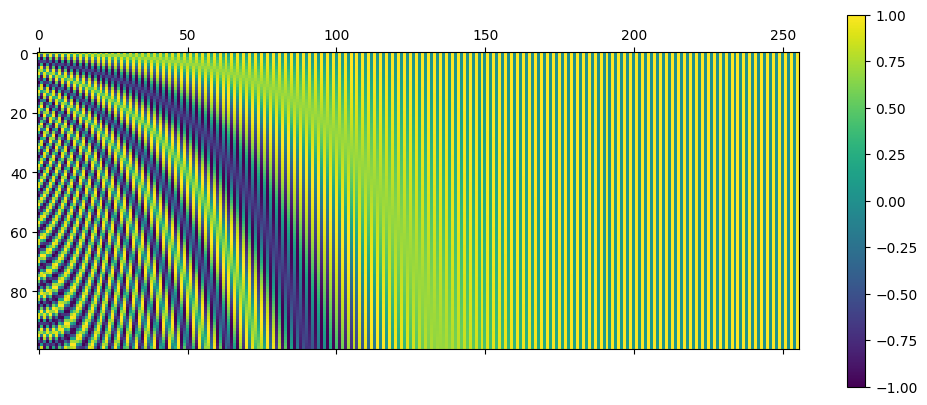

In [ ]:
num_noise_steps = 1000
time_embed_dim = 256

model = UNet()

t = torch.arange(start=1, end=1001, step=1).unsqueeze(1)
positional_embeding = model.pos_encoding(t)
embeding_img = positional_embeding.numpy()

cax = plt.matshow(embeding_img[0:100])
plt.gcf().colorbar(cax)
plt.show()

## Реализация прямого и обратного диффузионного процесса

Ниже представлен код для обучения и генерации диффузионной модели. Модель использует линейный планировщик зашумления.

In [ ]:
!pip install -q lightning

In [ ]:
import lightning as L
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
from torch.optim import AdamW
from torchvision.utils import make_grid


L.seed_everything(42)


class DiffusionGenerativeModel(L.LightningModule):
    def __init__(
        self,
        model,
        path,
        num_noise_steps=1000,
        beta_start=1e-4,
        beta_end=0.02,
        img_size=64,
        lr=0.001,
        save_images=True,
        save_progress=True,
    ):
        super().__init__()
        self.model = model
        self.path = Path(path)
        self.num_noise_steps = num_noise_steps
        self.beta_start = beta_start
        self.beta_end = beta_end
        self.img_size = img_size
        self.lr = lr
        self.save_images = save_images
        self.save_progress = save_progress

        # diffusion process linear noise schedule
        self.beta = self._get_noise_schedule()
        self.alpha = 1.0 - self.beta
        # \hat{\alpha}_{i-1} = \prod_{j=0}^{i-1} \alpha_j
        self.alpha_hat = torch.cumprod(self.alpha, dim=0)

        # init optimizer and loss for training
        self.criterion = nn.MSELoss()

    def configure_optimizers(self):
        optimizer = AdamW(self.model.parameters(), lr=self.lr)
        return optimizer

    def _get_noise_schedule(self):
        return torch.linspace(self.beta_start, self.beta_end, self.num_noise_steps)

    def _noise_images_batch(self, x, t):
        # \mu_i = \sqrt{\hat{\alpha}_i}
        mu = torch.sqrt(self.alpha_hat[t])[:, None, None, None].to(self.device)
        # \sigma_i = \sqrt{1 - \hat{\alpha}_i}
        sigma = torch.sqrt(1 - self.alpha_hat[t])[:, None, None, None].to(self.device)

        standard_normal_noise = torch.randn_like(x).to(self.device)
        noised_image_batch = mu * x + sigma * standard_normal_noise
        return noised_image_batch, standard_normal_noise

    def _get_timestams_batch(self):
        return torch.randint(low=1, high=self.num_noise_steps, size=(self.batch_size,))

    def generate_images_batch(self):
        # start from pure noise batch
        x = torch.randn((self.batch_size, 3, self.img_size, self.img_size)).to(
            self.device
        )
        # and apply self.num_noise_steps denoising steps with model
        for t_i in tqdm(reversed(range(0, self.num_noise_steps)), position=0):
            # Build tensor with timestamp index. Same for each element in batch
            t = torch.full((self.batch_size,), t_i).long().to(self.device)

            # predict noise on current timestamp
            with torch.inference_mode():
                pred_noise = self.model(x, t).detach()

            # restore noise parametrs on current timestamp
            alpha = self.alpha[t.to("cpu")][:, None, None, None].to(self.device)
            alpha_hat = self.alpha_hat[t.to("cpu")][:, None, None, None].to(self.device)
            beta = self.beta[t.to("cpu")][:, None, None, None].to(self.device)

            # partialy denoise batch of images
            x = x - (1.0 - alpha) / (1 - alpha_hat).sqrt() * pred_noise
            x = (1 / alpha.sqrt()) * x

            if self.save_progress and t_i % 20 == 0:
                prog_x = x.clamp(0, 1)
                prog_x = (prog_x * 255).type(torch.uint8)
                self._save_img(imgs=prog_x, path=self.path / "progress" / f"{t_i}.jpg")
            # add appropriate amount of noise for next step if any
            if t_i > 0:
                z = torch.randn_like(x).to(self.device)
                x = x + beta.sqrt() * z

        # clip x to valid 0..255 image range
        x = x.clamp(0, 1)
        x = (x * 255).type(torch.uint8)
        if self.save_progress:
            self._save_img(imgs=x, path=self.path / "progress" / f"{t_i}.jpg")
        return x

    def training_step(self, batch, batch_idx):
        # unpack data
        images, labels = batch
        self.batch_size = images.shape[0]
        t = self._get_timestams_batch()

        # prep batch of noised images
        noised_images, target_noise = self._noise_images_batch(images, t)

        # estimate noise with U-Net
        predicted_noise = self.model(noised_images, t)

        # optimize model to fit target noise
        loss = self.criterion(predicted_noise, target_noise)
        self.log("loss", loss, prog_bar=True, on_epoch=True, on_step=False)

        return loss

    def _save_img(self, imgs, path):
        image_grid = make_grid(imgs)
        # convert to numpy
        ndarr = image_grid.permute(1, 2, 0).to("cpu").numpy()
        # and save
        im = Image.fromarray(ndarr)
        im.save(path)

    def on_train_epoch_end(self):
        if self.save_images:
            generated_images = self.generate_images_batch()
            self._save_img(
                imgs=generated_images,
                path=self.path / f"model_{self.current_epoch}.jpg",
            )

    def predict_step(self, batch, batch_idx, dataloader_idx=0):
        images, labels = batch
        self.batch_size = images.shape[0]
        return self.generate_images_batch()

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


## Обучение диффузионных моделей

In [ ]:
!pip install -q astronn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 63.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 62.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 910.8/910.8 kB 71.1 MB/s eta 0:00:00


Рассмотрим пример использования определенной выше диффузионной модели генерации на примере датасета Galaxy10

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L13/galaxy10sdss_example.png" width="800"></center>

<center><em>Примеры каждого класса изображений из датасета Galaxy10</a></em></center>

<center><em>Source: <a href="https://github.com/henrysky/Galaxy10">Galaxy10 DECals Dataset</a></em></center>


In [ ]:
from astroNN.datasets import load_galaxy10

images, labels = load_galaxy10()

Galaxy10_DECals.h5: 100%|█████████▉| 2.74G/2.74G [02:44<00:00, 17.0MB/s]

Downloaded Galaxy10 successfully to /root/.astroNN/datasets/Galaxy10_DECals.h5


Galaxy10_DECals.h5: 2.74GB [02:51, 15.9MB/s]                            


In [ ]:
from torch.utils.data.dataset import Dataset


class GalaxyDataset(Dataset):
    def __init__(self, images, labels, transform):
        super().__init__()
        self.images = images
        self.labels = labels
        self.transform = transform

    def __getitem__(self, indx):
        image = self.images[indx]
        label = self.labels[indx]

        if self.transform:
            image = self.transform(image)

        return image, label

    def __len__(self):
        return len(self.images)

In [ ]:
from torchvision import transforms


transform = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Resize(64, antialias=True),
        transforms.RandomHorizontalFlip(0.5),
        transforms.RandomVerticalFlip(0.5),
    ]
)

dataset = GalaxyDataset(images, labels, transform)

Обучение сети осуществляется следующим образом. Процесс занимает продолжительное время. Для запуска обучения необходимо раскомментировать соответствующую строку кода.

In [ ]:
!mkdir /content/diffusion/
!mkdir /content/diffusion/lightning_logs

In [ ]:
from lightning.pytorch.callbacks import ModelCheckpoint

path = "/content/diffusion/"

train_loader = torch.utils.data.DataLoader(
    dataset, batch_size=8, shuffle=True, drop_last=True, num_workers=2
)

checkpoint_callback = ModelCheckpoint(
    dirpath=path,
    save_last=True,
    every_n_epochs=1,
    save_top_k=1,
    monitor="loss",
    filename="best",
    mode="min",
)

model = UNet()

ddpm = DiffusionGenerativeModel(model, path, save_progress=False)

trainer = L.Trainer(
    max_epochs=200,
    callbacks=[checkpoint_callback],
    log_every_n_steps=100,
    logger=L.pytorch.loggers.TensorBoardLogger(save_dir=path),
)

# trainer.fit(model=ddpm, train_dataloaders=train_loader)

INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO:lightning.pytorch.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs


Посмотрим на изображения, сгенерированные необученной моделью:

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

0it [00:00, ?it/s]

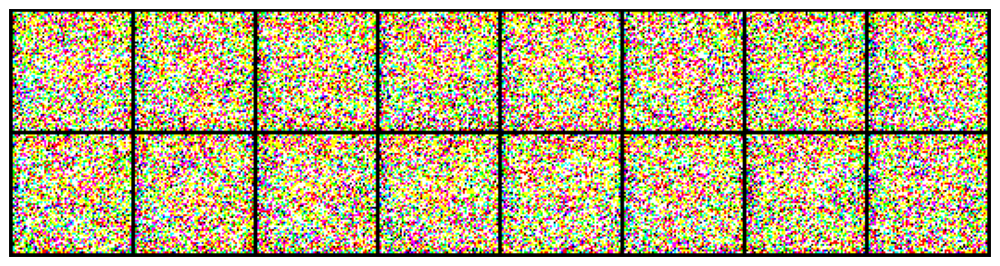

In [ ]:
import matplotlib.pyplot as plt
from warnings import simplefilter

simplefilter("ignore", category=RuntimeWarning)

dataset = GalaxyDataset(images[:16], labels[:16], transform)

gen_loader = torch.utils.data.DataLoader(
    dataset, batch_size=16, shuffle=False, num_workers=2
)  # just for image num

generated_images = trainer.predict(ddpm, gen_loader)[0]

image_grid = make_grid(generated_images)
# convert to numpy
ndarr = image_grid.permute(1, 2, 0).to("cpu").numpy()
# and show
image = Image.fromarray(ndarr)

fig = plt.figure(figsize=(14, 5))
plt.imshow(image)
plt.axis("off")
plt.show()

Видим, что сгенерированные изображения представляют собой шум.

Загрузим веса предобученной модели:


In [ ]:
!mkdir /content/diffusion/progress
!wget -q https://edunet.kea.su/repo/EduNet-content/dev-2.1/L13/weights/unconditioned_baseline.pt

In [ ]:
model = UNet()
model.load_state_dict(
    torch.load("/content/unconditioned_baseline.pt", map_location="cpu")
)
ddpm = DiffusionGenerativeModel(model, path)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

0it [00:00, ?it/s]

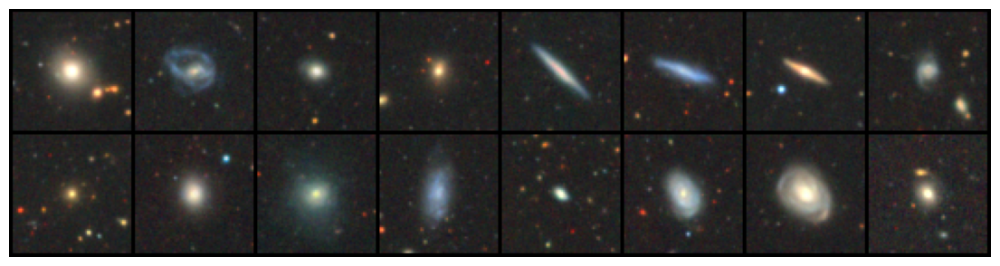

In [ ]:
generated_images = trainer.predict(ddpm, gen_loader)[0]
image_grid = make_grid(generated_images)
# convert to numpy
ndarr = image_grid.permute(1, 2, 0).to("cpu").numpy()
# and show
image = Image.fromarray(ndarr)

fig = plt.figure(figsize=(14, 5))
plt.imshow(image)
plt.axis("off")
plt.show()

Понаблюдаем за процессом генерации:

In [ ]:
import os
import imageio.v2 as imageio

path = Path("/content/diffusion/progress")
files = os.listdir(path)

files.sort(key=lambda x: int(x.split(".")[0]), reverse=True)

images = []
for file_name in files:
    images.append(imageio.imread(path / file_name))

imageio.mimsave("./progress.gif", images, loop=0)

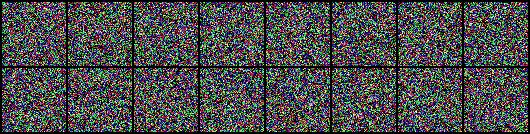

In [ ]:
from IPython.display import Image, display

image = Image(filename="./progress.gif", width=1000)
display(image)

## Диффузия в латентном пространстве

Как мы упомянули выше, попиксельный Self-Attention — вычислительно тяжелый слой. В 2022 году вышла [статья 🎓[arxiv]](https://arxiv.org/pdf/2112.10752.pdf), предлагающая объединение VAE и DM.

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.1/L13/latent_diffusion_architecture.png" width="800"></center>

<center><em>Архитектура модели диффузии в латентном пространстве</a></em></center>

<center><em>Source: <a href="https://arxiv.org/pdf/2112.10752.pdf">High-Resolution Image Synthesis with Latent Diffusion Models</a></em></center>

Отметим некоторые особенности архитектуры:
- в архитектуре используется заранее предобученный на большом массиве данных VAE, что позволяет генерировать картинки большого размера,
- “зашумление” и “расшумление” происходит в латентном пространстве,
- помимо позиционного эмбеддинга при изменении размерности могут “подмешиваться” номера классов, эмбеддинги текстов или изображений, эмбеддинги семантических масок и т. д.


## Библиотека 🤗 Diffusers


Большое количество предобученных диффузионных моделей доступно в библиотеке  [Diffusers 🛠️[doc]](https://huggingface.co/docs/diffusers/index) от [Hugging Face 🛠️[doc]](https://huggingface.co). Там же можно найти код для обучения или дообучения моделей.


Для примера попробуем загрузить предобученную text-to-image модель `stable-diffusion-v1-5` и сгенерировать изображение с ее помощью.

In [ ]:
!pip install -q diffusers

In [ ]:
from diffusers import AutoPipelineForText2Image
from IPython.display import clear_output

pipe = AutoPipelineForText2Image.from_pretrained(
    "runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16, variant="fp16"
)
clear_output()
pipe.enable_model_cpu_offload()

  0%|          | 0/50 [00:00<?, ?it/s]

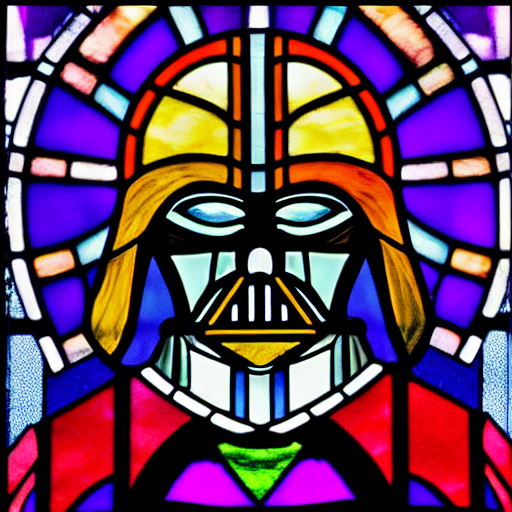

In [ ]:
prompt = "stained glass of darth vader, backlight, centered composition, masterpiece, photorealistic, 8k"

image = pipe(
    prompt=prompt,
).images[0]

image

<font size="6">Литература</font>

<font size="5">GAN:</font>

* [[book] 📚 «Генеративное глубокое обучение. Творческий потенциал нейронных сетей»](https://habr.com/ru/company/piter/blog/504956/)
* [[arxiv] 🎓 Generative Adversarial Networks (Goodfellow et al., 2014)](https://arxiv.org/abs/1406.2661)
* [[video] 📺 Разбор оригинальной статьи GAN](https://www.youtube.com/watch?v=eyxmSmjmNS0)
* [[video] 📺 Лекция Иана Гудфеллоу](https://www.youtube.com/watch?v=HGYYEUSm-0Q)
* [[blog] ✏️ Generative adversarial networks](https://deepgenerativemodels.github.io/notes/gan/)
* [[article] 🎓 Самые современные генеративные модели](https://paperswithcode.com/methods/category/generative-models)
* [[blog] ✏️ Stroke of Genius: GauGAN Turns Doodles into Stunning, Photorealistic Landscapes](https://blogs.nvidia.com/blog/gaugan-photorealistic-landscapes-nvidia-research/)

<font size="5">DCGAN:</font>

* [[arxiv] 🎓 Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks (Radford et al., 2015)](https://arxiv.org/abs/1511.06434).
* [[blog] ✏️ DCGAN TUTORIAL](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html)

<font size="5">Wasserstein GAN:</font>

* [[arxiv] 🎓 Wasserstein GAN (Arjovsky et. al., 2017)](https://arxiv.org/abs/1701.07875)
* [[blog] ✏️ Wasserstein GAN and the Kantorovich-Rubinstein Duality](https://vincentherrmann.github.io/blog/wasserstein/)
* [[arxiv] 🎓 Improved Training of Wasserstein GANs (Gulrajani et al., 2017)](https://arxiv.org/abs/1704.00028)
* [[arxiv] 🎓 Spectral Normalization for Generative Adversarial Networks (Miyato et al., 2018)](https://arxiv.org/abs/1802.05957).

<font size="5">ProGAN → StyleGAN → StyleGAN2 → Alias-Free GAN:</font>

* [[arxiv] 🎓 Progressive Growing of GANs for Improved Quality, Stability, and Variation (ProGAN) (Karras et al., 2017)](https://arxiv.org/abs/1710.10196)
* [[arxiv] 🎓 A Style-Based Generator Architecture for Generative Adversarial Networks (StyleGAN) (Karras et al., 2018)](https://arxiv.org/abs/1812.04948)
* [[arxiv] 🎓 Analyzing and Improving the Image Quality of StyleGAN (StyleGAN2) (Karras et al., 2019)](https://arxiv.org/abs/1912.04958)
* [[arxiv] 🎓 Alias-Free Generative Adversarial Networks (Alias-Free GAN) (Karras et al., 2021)](https://arxiv.org/abs/2106.12423)

<font size="5">Тонкости обучения GAN:</font>

* [[blog] ✏️ Детальный разбор тонкостей и советов](https://beckham.nz/2021/06/28/training-gans.html)
* [[arxiv] 🎓 Top-k Training of GANs: Improving GAN Performance by Throwing Away Bad Samples (Sinha et al., 2020)](https://arxiv.org/abs/2002.06224)

<font size="5">BigGAN: </font>

* [[arxiv] 🎓 Large Scale GAN Training for High Fidelity Natural Image Synthesis (Brock et al., 2018)](https://arxiv.org/abs/1809.11096)

<font size="5">StackGAN:</font>

* [[arxiv] 🎓 StackGAN: Text to Photo-realistic Image Synthesis with Stacked Generative Adversarial Networks (Zhang et al., 2016)](https://arxiv.org/abs/1612.03242), [[git] 🐾 результаты](https://github.com/hanzhanggit/StackGAN).
* [[arxiv] 🎓 StackGAN++: Realistic Image Synthesis with Stacked Generative Adversarial Networks (Zhang et al., 2017)](https://arxiv.org/abs/1710.10916)
* [[arxiv] 🎓 Photo-Realistic Single Image Super-Resolution Using a Generative Adversarial Network (Ledig et al., 2016)](https://arxiv.org/abs/1609.04802)
* [[book] 📚 Deep Learning Generative Models for Image Synthesis and Image Translation](https://www.rulit.me/data/programs/resources/pdf/Generative-Adversarial-Networks-with-Python_RuLit_Me_610886.pdf)
* [[video] 📺 StackGAN++ Realistic Image Synthesis with Stacked Generative Adversarial Networks | AISC](https://www.youtube.com/watch?v=PXWIaLE7_NU)
* [[video] 📺 Text to Photo-realistic Image Synthesis with Stacked Generative Adversarial Networks](https://www.youtube.com/watch?v=crI5K4RCZws)

<font size="5">ControlGAN:</font>

* [[arxiv] 🎓 Controllable Generative Adversarial Network](https://arxiv.org/pdf/1708.00598.pdf)
* [[arxiv] 🎓 Controllable Text-to-Image Generation](https://arxiv.org/pdf/1909.07083.pdf)
* [[arxiv] 🎓 Image Generation and Recognition (Emotions)](https://arxiv.org/pdf/1910.05774.pdf)
* [[article] 🎓 Natural Language & Text-to-Image 2019](https://meta-guide.com/data/data-processing/text-to-image-systems/natural-language-text-to-image-2019)

<font size="5">AC-GAN:</font>

* [[blog] ✏️ How to Develop an Auxiliary Classifier GAN (AC-GAN) From Scratch with Keras](https://machinelearningmastery.com/how-to-develop-an-auxiliary-classifier-gan-ac-gan-from-scratch-with-keras/)
* [[arxiv] 🎓 Conditional Image Synthesis with Auxiliary Classifier GANs (Odena et al., 2017)](https://arxiv.org/pdf/1610.09585.pdf), [[git] 🐾 результаты](https://github.com/clvrai/ACGAN-PyTorch)
* [[arxiv] 🎓 An Auxiliary Classifier Generative Adversarial Framework for Relation Extraction (Zhao, 2019)](https://arxiv.org/pdf/1909.05370.pdf)
* [[article] 🎓 A Multi-Class Hinge Loss for Conditional GANs](https://openaccess.thecvf.com/content/WACV2021/papers/Kavalerov_A_Multi-Class_Hinge_Loss_for_Conditional_GANs_WACV_2021_paper.pdf)

<font size="5">Domain Transfer Network:</font>

* [[arxiv] 🎓 Unsupervised Cross-Domain Image Generation (Taigma et al., 2016)](https://arxiv.org/abs/1611.02200)

<font size="5">Pix2Pix:</font>

* [[arxiv] 🎓 Image-to-Image Translation with Conditional Adversarial Networks (Isola et al., 2016)](https://arxiv.org/abs/1611.07004)

<font size="5">Семантическая генерация:</font>

* [[arxiv] 🎓 Learning to Generate Chairs, Tables and Cars with Convolutional Networks (Dosovitskiy et al., 2017)](https://arxiv.org/abs/1411.5928)

<font size="5">Text-to-Image:</font>

* [[arxiv] 🎓 Text-to-Image Generation with Attention Based Recurrent Neural Networks (Zia et al., 2020)](https://arxiv.org/abs/2001.06658)

<font size="5">Image-to-Image:</font>

* [[arxiv] 🎓 GANs N' Roses: Stable, Controllable, Diverse Image to Image Translation (Chong et al., 2021)](https://arxiv.org/abs/2106.06561)
* [[arxiv] 🎓 Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks (Zhu et al., 2017)](https://arxiv.org/abs/1703.10593)

<font size="5">Дополнительно:</font>

* [[git] 🐾 MNIST CelebA cGAN cDCGAN](https://github.com/znxlwm/pytorch-MNIST-CelebA-cGAN-cDCGAN)
* [[git] 🐾 Text-to-Photo realistic Image Synthesis with Stacked Generative Adversarial Networks](https://github.com/zeusm9/Text-to-Photo-realistic-Image-Synthesis-with-Stacked-Generative-Adversarial-Networks)
* [[git] 🐾 ControlGAN](https://github.com/mrlibw/ControlGAN)
* [[git] 🐾 ControlGAN-Tensorflow](https://github.com/taki0112/ControlGAN-Tensorflow)
* [[git] 🐾 Keras-ACGan](https://github.com/lukedeo/keras-acgan)
* [[demo] 🎮 Множество примеров различных генераторов](https://thisxdoesnotexist.com)